# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I , confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

# Introduction

Electricity is a fundamental human right, and the Spanish government wants us to develop a machine learning model that will assist them in understanding and forecasting their energy shortfall. This will assist the government in planning ahead of time and improving and diversifying its energy mix. Spain, like most other countries, wishes to transition to a 100% renewable energy mix. Our model will not forecast how quickly they will do this, but it will get us one step closer to knowing the country's needs and how to plan ahead of time to become a blackout-proof country.

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [1]:
import numpy as np
import pandas as pd

#data viz
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries for data preparation and model building
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn import metrics
from statsmodels.graphics.correlation import plot_corr
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from scipy import stats
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor


import warnings
warnings.filterwarnings('ignore')

/var/folders/f8/9w88t3qs6sgbxymfrsbw1kf40000gn/T/ipykernel_61868/2921072892.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section we load the required from the `df_train` and `df_test` file into a DataFrame. |

---

- **First one is Train data frame**

In [2]:
traindf = pd.read_csv("./data/df_train.csv")

#show first 5 rows of the train data
traindf.head()

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


- **Test data frame**

In [3]:
testdf = pd.read_csv('./data/df_test.csv')

#Confirmation of the test data
testdf.head()

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min
0,8763,2018-01-01 00:00:00,5.000000,level_8,0.0,5.000000,87.000000,71.333333,20.000000,3.000000,...,287.816667,280.816667,287.356667,276.150000,280.380000,286.816667,285.150000,283.150000,279.866667,279.150000
1,8764,2018-01-01 03:00:00,4.666667,level_8,0.0,5.333333,89.000000,78.000000,0.000000,3.666667,...,284.816667,280.483333,284.190000,277.816667,281.010000,283.483333,284.150000,281.150000,279.193333,278.150000
2,8765,2018-01-01 06:00:00,2.333333,level_7,0.0,5.000000,89.000000,89.666667,0.000000,2.333333,...,284.483333,276.483333,283.150000,276.816667,279.196667,281.816667,282.150000,280.483333,276.340000,276.150000
3,8766,2018-01-01 09:00:00,2.666667,level_7,0.0,5.333333,93.333333,82.666667,26.666667,5.666667,...,284.150000,277.150000,283.190000,279.150000,281.740000,282.150000,284.483333,279.150000,275.953333,274.483333
4,8767,2018-01-01 12:00:00,4.000000,level_7,0.0,8.666667,65.333333,64.000000,26.666667,10.666667,...,287.483333,281.150000,286.816667,281.816667,284.116667,286.150000,286.816667,284.483333,280.686667,280.150000


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, we will perform an in-depth analysis of all the variables in the DataFrame. |

---


Now we need to make a use of **concatenation** so that the changes made, applies to the whole dataset.

In [4]:
### Combining the train and test dataset.
df = pd.concat([traindf,testdf])

### Verifying the total number of rows and columns
df.shape

(11683, 49)

With the above results, we were suppose to remove *Unnamed* column as it doesn't consist of any data we need.

In [5]:
### remove Unnamed column
df = df.drop(['Unnamed: 0'], axis=1)

# Checking data type for each column.
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 48 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   time                  11683 non-null  object 
 1   Madrid_wind_speed     11683 non-null  float64
 2   Valencia_wind_deg     11683 non-null  object 
 3   Bilbao_rain_1h        11683 non-null  float64
 4   Valencia_wind_speed   11683 non-null  float64
 5   Seville_humidity      11683 non-null  float64
 6   Madrid_humidity       11683 non-null  float64
 7   Bilbao_clouds_all     11683 non-null  float64
 8   Bilbao_wind_speed     11683 non-null  float64
 9   Seville_clouds_all    11683 non-null  float64
 10  Bilbao_wind_deg       11683 non-null  float64
 11  Barcelona_wind_speed  11683 non-null  float64
 12  Barcelona_wind_deg    11683 non-null  float64
 13  Madrid_clouds_all     11683 non-null  float64
 14  Seville_wind_speed    11683 non-null  float64
 15  Barcelona_rain_1h     116

This shows that there are 46 columns of numerical types and 3 columns of Catergorical types and valencia_pressure has some missing values. The target variable is Numerical and float type

Key take-away:

- categorical variables: 3 columns of Catergorical types(Seville_pressure,Valencia_wind_deg and time)
- numerical variables: 46 columns of numerical types
- missing data: valencia_pressure has some missing values

In [6]:
# then select the numeric features
df_num = df.select_dtypes(include='number')
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 45 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Madrid_wind_speed     11683 non-null  float64
 1   Bilbao_rain_1h        11683 non-null  float64
 2   Valencia_wind_speed   11683 non-null  float64
 3   Seville_humidity      11683 non-null  float64
 4   Madrid_humidity       11683 non-null  float64
 5   Bilbao_clouds_all     11683 non-null  float64
 6   Bilbao_wind_speed     11683 non-null  float64
 7   Seville_clouds_all    11683 non-null  float64
 8   Bilbao_wind_deg       11683 non-null  float64
 9   Barcelona_wind_speed  11683 non-null  float64
 10  Barcelona_wind_deg    11683 non-null  float64
 11  Madrid_clouds_all     11683 non-null  float64
 12  Seville_wind_speed    11683 non-null  float64
 13  Barcelona_rain_1h     11683 non-null  float64
 14  Seville_rain_1h       11683 non-null  float64
 15  Bilbao_snow_3h        116

In [7]:
# Check the  percentage and the of missing values in our df
df_num.isnull().sum()


Madrid_wind_speed          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure       2522
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather_id          0
Seville_temp               0
Valencia_humidity          0
Valencia_temp_min          0
Barcelona_temp

Lokking from the above we see the Valencia has a total of 2522 missing values while the load_shortfall_3h which is our dependent variable has 2920 missing values and this is due to the concatination we performed earlier, those value ae coming from the test_data.

---
Correlation analysis is a crucial technique when analysing the data, helping to identify relationships between variables in a dataset. So for us to be able to analyse correlation coefficients between variables in a dataset, lets plot a *Correlation Matrix* below.

<Axes: >

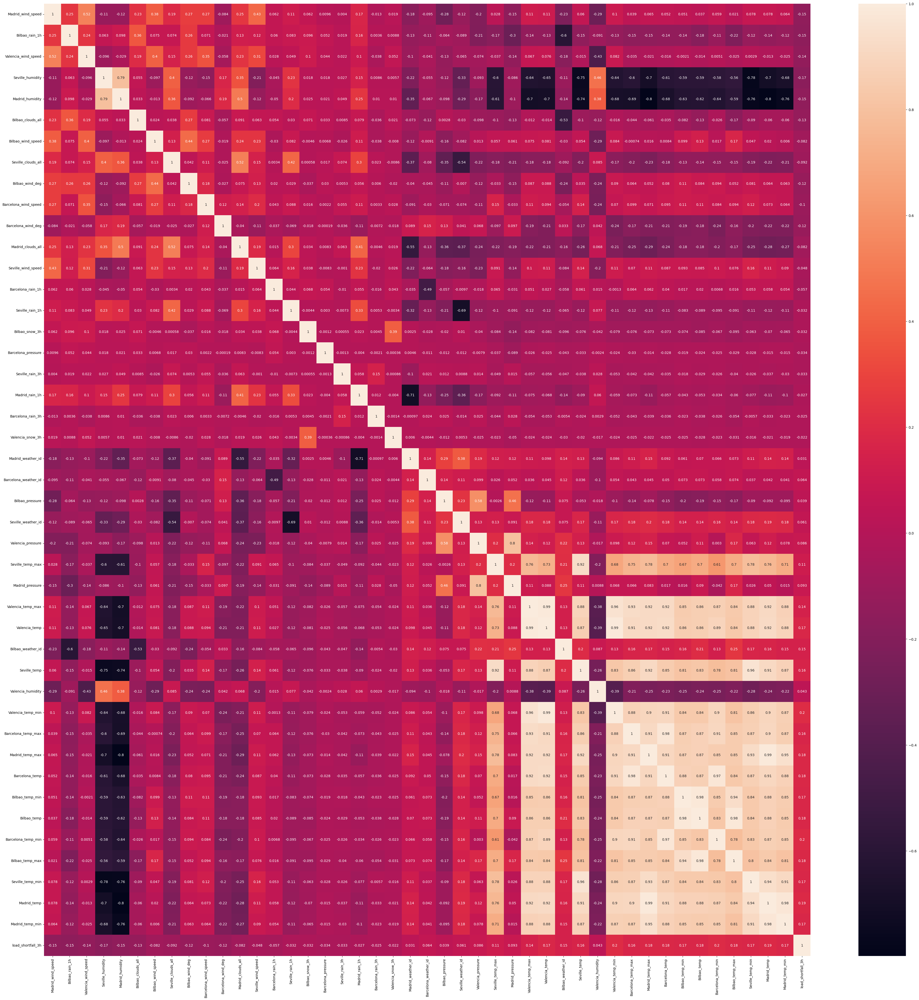

In [8]:
### Plotting the heatmap
fig, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(df_num.corr(), annot=True)

Based from the above correlation matrix we see some column such Barcelona_temp, Barcelona_temp_min, Barcelona_temp_max, Madrid_temp_min, Madrid_temp_max, Madrid_temp, Valencia_temp, Valencia_temp_min, Valencia_temp_max, Seville_temp, Seville_temp_min, Seville_temp_max show high correlation.

Now lets perform an in depth analysis based on what each column consist of.

With the results above. We got different cities, so for us to perform the EDA in an uncomplicated process. Let's split/group the data into cities eg. Creating a subset for *Madrid, Seville, Valencia* **etc**.

## 4. The EDA  and Data Engineering for each city.

- **The *Madrid* City subset.**

In [9]:
### Assigning all Madrid columns to a new variable.

Madrid = df[['Madrid_wind_speed', 
               'Madrid_humidity',
               'Madrid_clouds_all',
                 'Madrid_pressure',
                  'Madrid_rain_1h',
                   'Madrid_weather_id', 
                   'Madrid_temp_min',
                   'Madrid_temp',
                   'Madrid_temp_max']].copy()
Madrid.head()


,Madrid_wind_speed,Madrid_humidity,Madrid_clouds_all,Madrid_pressure,Madrid_rain_1h,Madrid_weather_id,Madrid_temp_min,Madrid_temp,Madrid_temp_max
0,0.666667,64.000000,0.0,971.333333,0.0,800.0,265.938000,265.938000,265.938000
1,0.333333,64.666667,0.0,972.666667,0.0,800.0,266.386667,266.386667,266.386667
2,1.000000,64.333333,0.0,974.000000,0.0,800.0,272.708667,272.708667,272.708667
3,1.000000,56.333333,0.0,994.666667,0.0,800.0,281.895219,281.895219,281.895219
4,1.000000,57.000000,0.0,1035.333333,0.0,800.0,280.678437,280.678437,280.678437


In [10]:
Madrid.describe().T

,count,mean,std,min,25%,50%,75%,max
Madrid_wind_speed,11683.0,2.433750,1.831762,0.000000,1.000000,2.000000,3.333333,13.333333
Madrid_humidity,11683.0,58.721818,24.390621,6.333333,38.000000,59.333333,80.000000,100.000000
Madrid_clouds_all,11683.0,20.668692,28.478087,0.000000,0.000000,0.000000,38.333333,100.000000
Madrid_pressure,11683.0,1011.797412,19.983122,927.666667,1012.666667,1017.333333,1021.666667,1038.000000
Madrid_rain_1h,11683.0,0.043328,0.163996,0.000000,0.000000,0.000000,0.000000,3.000000
Madrid_weather_id,11683.0,769.851665,81.914258,211.000000,800.000000,800.000000,800.666667,804.000000
Madrid_temp_min,11683.0,287.056222,9.093455,264.983333,280.150000,285.816667,293.708917,310.383333
Madrid_temp,11683.0,288.282055,9.258559,264.983333,281.250000,286.923333,294.993167,313.133333
Madrid_temp_max,11683.0,289.377372,9.594562,264.983333,282.150000,287.843333,296.483333,314.483333


Wind Speed:

- The mean wind speed is relatively low at around 2.43 meters per second, indicating generally calm conditions.
- The standard deviation suggests some variability in wind speed, with values ranging from 0 to 13.33 meters per second.
- Wind speed tends to be moderate, with most values falling below 3.33 meters per second (75th percentile).
<p>This means that Madrid is not an ideal city for installation of wind turbines.</p>

In [11]:
# lets check for any outliers using the kurtosis
Madrid.kurtosis()

Madrid_wind_speed     2.156333
Madrid_humidity      -1.151940
Madrid_clouds_all    -0.076188
Madrid_pressure       3.733443
Madrid_rain_1h       63.372354
Madrid_weather_id     8.018543
Madrid_temp_min      -0.683538
Madrid_temp          -0.634603
Madrid_temp_max      -0.668313
dtype: float64

From the above we can see some outliers ( columns with value that is > 3) such as Madrid_pressure, Madrid_rain_1h, Madrid_weather_id.
<p>Madrid_rain_1h: Outlier detected (value: 63.372354). This value is exceptionally high compared to the rest of the data and likely represents an instance of heavy rainfall.</p>

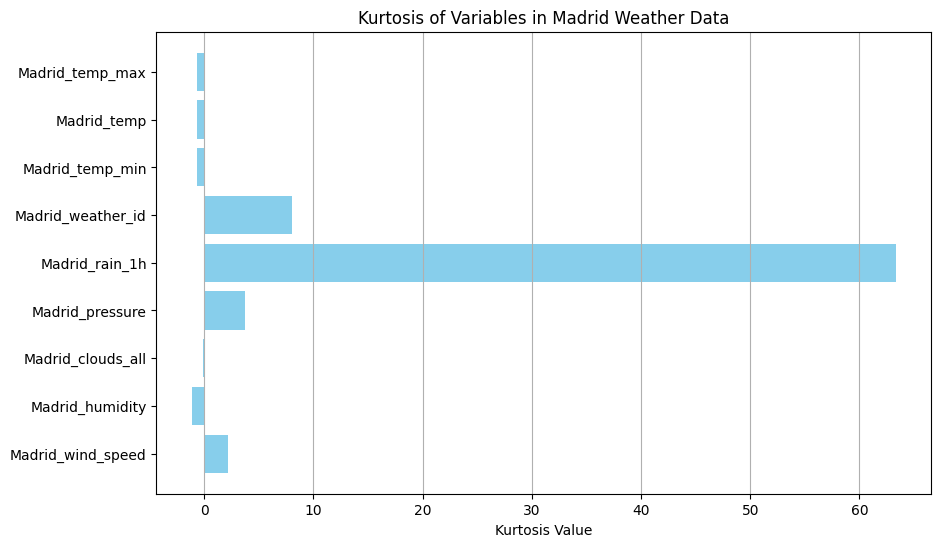

In [12]:
variables = ['Madrid_wind_speed', 'Madrid_humidity', 'Madrid_clouds_all', 
             'Madrid_pressure', 'Madrid_rain_1h', 'Madrid_weather_id', 
             'Madrid_temp_min', 'Madrid_temp', 'Madrid_temp_max']
kurtosis_values = [2.156333, -1.151940, -0.076188, 3.733443, 63.372354, 
                   8.018543, -0.683538, -0.634603, -0.668313]

# The kurtosis graph
plt.figure(figsize=(10, 6))
plt.barh(variables, kurtosis_values, color='skyblue')
plt.xlabel('Kurtosis Value')
plt.title('Kurtosis of Variables in Madrid Weather Data')
plt.grid(axis='x')

The above definately confirms that the Madrid_rain_1h has outliers, Madrid_cloud_all is below zero so that means that the city should not be experiencing that amount of rain fall.

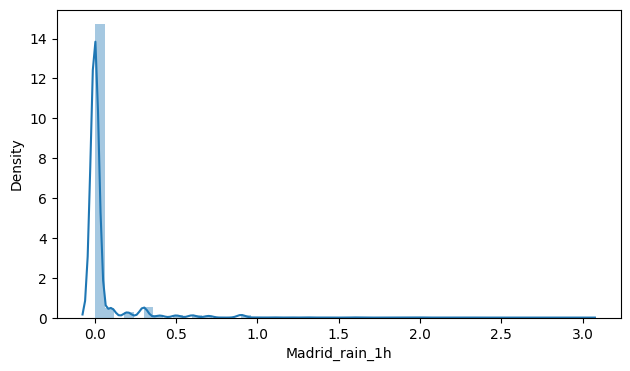

In [13]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.distplot(Madrid['Madrid_rain_1h'])
plt.show()

<Axes: ylabel='Madrid_rain_1h'>

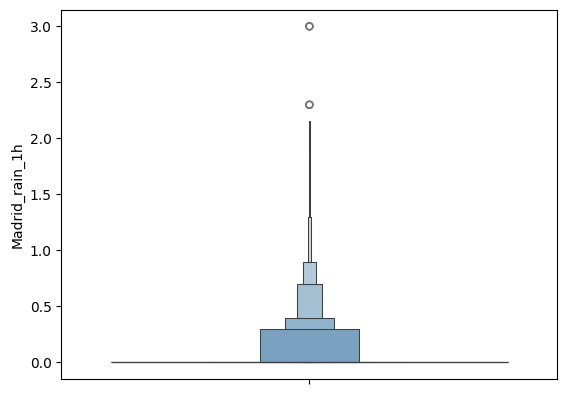

In [14]:
sns.boxenplot(df['Madrid_rain_1h'])

Let's remove any outliers in the Madrid subset above. In case there are any, so that we avoid them influencing our model. 

In [15]:
### remove outliers
Madrid[(np.abs(stats.zscore(Madrid)) < 3).all(axis=1)]

,Madrid_wind_speed,Madrid_humidity,Madrid_clouds_all,Madrid_pressure,Madrid_rain_1h,Madrid_weather_id,Madrid_temp_min,Madrid_temp,Madrid_temp_max
0,0.666667,64.000000,0.0,971.333333,0.0,800.0,265.938000,265.938000,265.938000
1,0.333333,64.666667,0.0,972.666667,0.0,800.0,266.386667,266.386667,266.386667
2,1.000000,64.333333,0.0,974.000000,0.0,800.0,272.708667,272.708667,272.708667
3,1.000000,56.333333,0.0,994.666667,0.0,800.0,281.895219,281.895219,281.895219
4,1.000000,57.000000,0.0,1035.333333,0.0,800.0,280.678437,280.678437,280.678437
...,...,...,...,...,...,...,...,...,...
2915,0.333333,49.666667,0.0,1031.666667,0.0,800.0,271.150000,274.910000,281.483333
2916,0.333333,28.333333,0.0,1031.333333,0.0,800.0,280.483333,283.156667,287.816667
2917,1.000000,26.333333,0.0,1030.000000,0.0,800.0,286.483333,287.733333,288.816667
2918,1.000000,56.666667,0.0,1030.333333,0.0,800.0,282.150000,283.813333,285.150000


In [16]:
# lets check for any outliers to confirm using the kurtosis
Madrid.kurtosis()

Madrid_wind_speed     2.156333
Madrid_humidity      -1.151940
Madrid_clouds_all    -0.076188
Madrid_pressure       3.733443
Madrid_rain_1h       63.372354
Madrid_weather_id     8.018543
Madrid_temp_min      -0.683538
Madrid_temp          -0.634603
Madrid_temp_max      -0.668313
dtype: float64

Now let's assess the **Madrid** data-types and also verify if are there any Null-values.

In [17]:
Madrid.info()
### Madrid.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Madrid_wind_speed  11683 non-null  float64
 1   Madrid_humidity    11683 non-null  float64
 2   Madrid_clouds_all  11683 non-null  float64
 3   Madrid_pressure    11683 non-null  float64
 4   Madrid_rain_1h     11683 non-null  float64
 5   Madrid_weather_id  11683 non-null  float64
 6   Madrid_temp_min    11683 non-null  float64
 7   Madrid_temp        11683 non-null  float64
 8   Madrid_temp_max    11683 non-null  float64
dtypes: float64(9)
memory usage: 912.7 KB


Since we seem to have numerical data, let us perform some **Statical Analysis** (*our five Number Summary*).

In [18]:
# Creating five Number Summary for each column.
Madrid.describe().T

,count,mean,std,min,25%,50%,75%,max
Madrid_wind_speed,11683.0,2.433750,1.831762,0.000000,1.000000,2.000000,3.333333,13.333333
Madrid_humidity,11683.0,58.721818,24.390621,6.333333,38.000000,59.333333,80.000000,100.000000
Madrid_clouds_all,11683.0,20.668692,28.478087,0.000000,0.000000,0.000000,38.333333,100.000000
Madrid_pressure,11683.0,1011.797412,19.983122,927.666667,1012.666667,1017.333333,1021.666667,1038.000000
Madrid_rain_1h,11683.0,0.043328,0.163996,0.000000,0.000000,0.000000,0.000000,3.000000
Madrid_weather_id,11683.0,769.851665,81.914258,211.000000,800.000000,800.000000,800.666667,804.000000
Madrid_temp_min,11683.0,287.056222,9.093455,264.983333,280.150000,285.816667,293.708917,310.383333
Madrid_temp,11683.0,288.282055,9.258559,264.983333,281.250000,286.923333,294.993167,313.133333
Madrid_temp_max,11683.0,289.377372,9.594562,264.983333,282.150000,287.843333,296.483333,314.483333


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

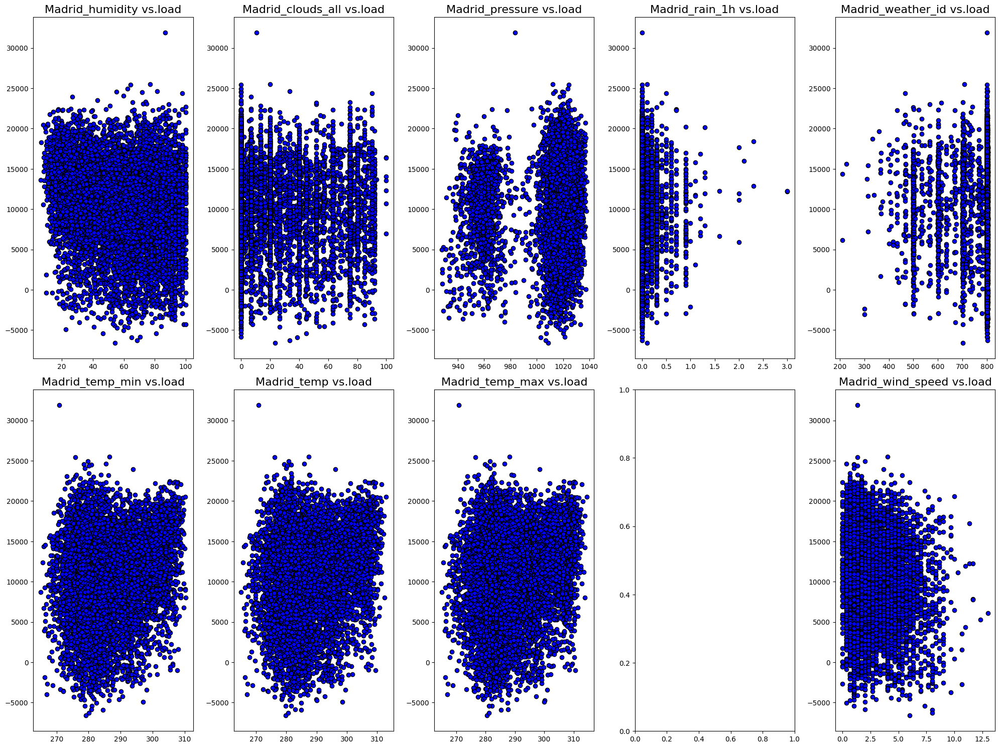

In [19]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Madrid.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)

This way we can efficiently create a grid of scatter plots to visualize the relationship between each feature in the Madrid DataFrame and the load_shortfall_3h target variable.

Since the **Madrid** subset is in a Numerical format, let's make a use of the **PairPlot**.

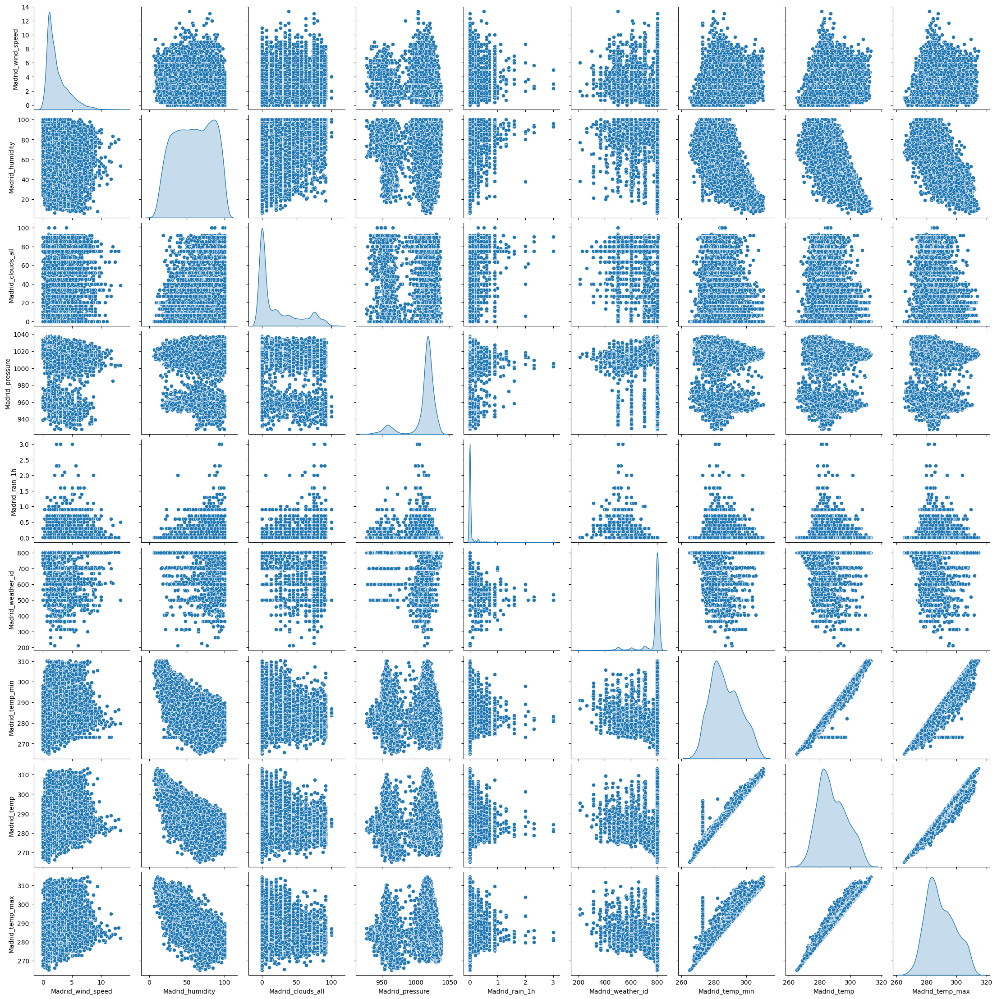

In [20]:
sns.pairplot(Madrid, diag_kind='kde')

For us to handle any of the outliers, let's make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

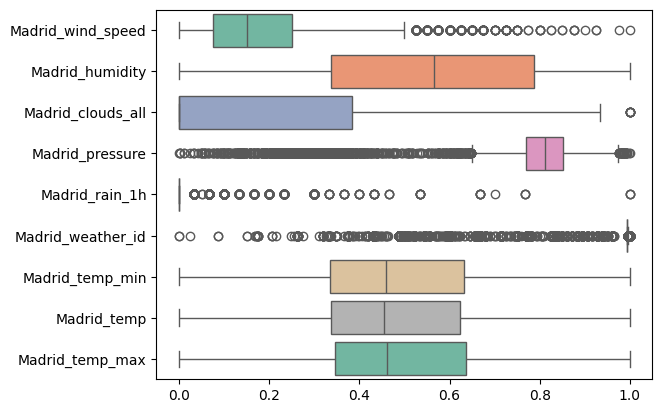

In [21]:
from sklearn.preprocessing import MinMaxScaler

# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Madrid_ = pd.DataFrame(scaler.fit_transform(Madrid), columns=Madrid.columns)
sns.boxplot(data=Madrid_, orient="h", palette="Set2")

In [22]:
# sns.histplot(Madrid,kde=True)

We previously assessed the correlation of the entire dataset, now let's assess the correlation of the **Madrid** subset.

<Axes: >

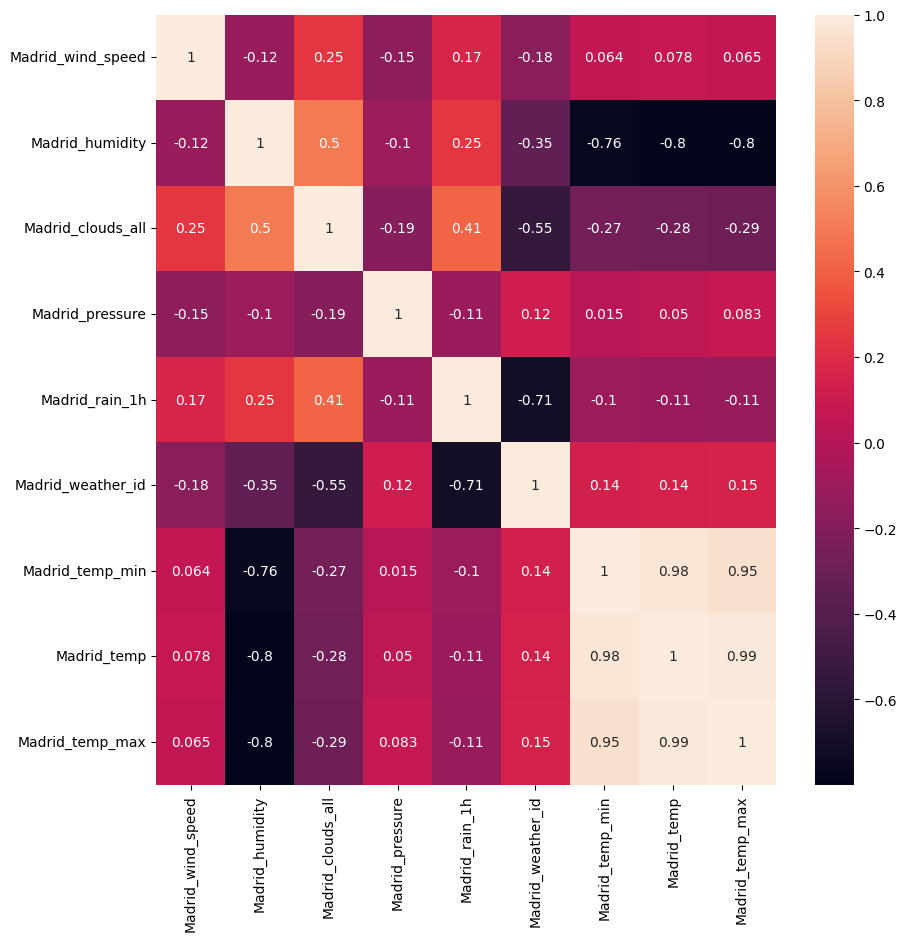

In [23]:
# Assessing the correlation of the dataset using the HEATMAP
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Madrid.corr(), annot=True)

Text(0.5, 1.0, 'Total load shortfall per year')

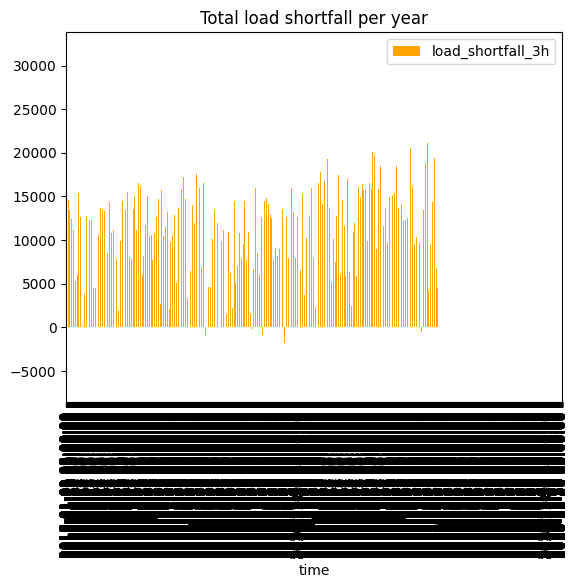

In [24]:
df[['time',
 'load_shortfall_3h']].groupby('time').sum().plot.bar(color='orange')
plt.title('Total load shortfall per year')

- **The *Seville* City subset.**

In [25]:
### Assigning all Seville columns to a new variable.
Seville = df[['Seville_humidity',
                 'Seville_clouds_all',
                   'Seville_wind_speed',
                'Seville_pressure', 
                'Seville_rain_1h',
                 'Seville_rain_3h',
                 'Seville_weather_id',
                 'Seville_temp_max',
                 'Seville_temp',
                 'Seville_temp_min']].copy()

Seville.head()

,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_temp_max,Seville_temp,Seville_temp_min
0,74.333333,0.0,3.333333,sp25,0.0,0.0,800.0,274.254667,274.254667,274.254667
1,78.333333,0.0,3.333333,sp25,0.0,0.0,800.0,274.945000,274.945000,274.945000
2,71.333333,0.0,2.666667,sp25,0.0,0.0,800.0,278.792000,278.792000,278.792000
3,65.333333,0.0,4.000000,sp25,0.0,0.0,800.0,285.394000,285.394000,285.394000
4,59.000000,0.0,3.000000,sp25,0.0,0.0,800.0,285.513719,285.513719,285.513719


In [26]:
Seville[["Seville_pressure"]].info()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 1 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Seville_pressure  11683 non-null  object
dtypes: object(1)
memory usage: 182.5+ KB


Looking at the above results, the column **Seville_pressure** consist of the **object** datatype. So let us try to convert it to a **Numerical** datatype format.

In [27]:
### reformatting the data to the correct type
Seville['Seville_pressure'] = Seville['Seville_pressure'].astype(str).str.extract('(\d+)', expand=False).astype(int)

##Seville['Seville_rain_3h'].unique().sum()

Let's remove any outliers in the **Seville** subset above. In case there are any, so that we avoid them influencing our model

In [28]:
# ### remove outliers
Seville[(np.abs(stats.zscore(Seville)) < 3).all(axis=1)]

,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_temp_max,Seville_temp,Seville_temp_min
0,74.333333,0.0,3.333333,25,0.0,0.0,800.0,274.254667,274.254667,274.254667
1,78.333333,0.0,3.333333,25,0.0,0.0,800.0,274.945000,274.945000,274.945000
2,71.333333,0.0,2.666667,25,0.0,0.0,800.0,278.792000,278.792000,278.792000
3,65.333333,0.0,4.000000,25,0.0,0.0,800.0,285.394000,285.394000,285.394000
4,59.000000,0.0,3.000000,25,0.0,0.0,800.0,285.513719,285.513719,285.513719
...,...,...,...,...,...,...,...,...,...,...
2915,81.666667,0.0,2.000000,24,0.0,0.0,800.0,280.816667,280.210000,279.816667
2916,61.000000,0.0,4.000000,24,0.0,0.0,800.0,287.483333,287.280000,287.150000
2917,47.000000,0.0,4.666667,23,0.0,0.0,800.0,290.816667,290.816667,290.816667
2918,52.666667,0.0,3.333333,23,0.0,0.0,800.0,288.816667,288.300000,287.483333


In [29]:
Seville.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Seville_humidity    11683 non-null  float64
 1   Seville_clouds_all  11683 non-null  float64
 2   Seville_wind_speed  11683 non-null  float64
 3   Seville_pressure    11683 non-null  int64  
 4   Seville_rain_1h     11683 non-null  float64
 5   Seville_rain_3h     11683 non-null  float64
 6   Seville_weather_id  11683 non-null  float64
 7   Seville_temp_max    11683 non-null  float64
 8   Seville_temp        11683 non-null  float64
 9   Seville_temp_min    11683 non-null  float64
dtypes: float64(9), int64(1)
memory usage: 1004.0 KB


Looking at column **Seville_pressure**, the datatype was successfully converted to the numerical datatype. Now with the numerical data we have, let us perform some **Statical Analysis** (our five Number Summary).

In [30]:
Seville.describe()

,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_temp_max,Seville_temp,Seville_temp_min
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000
mean,63.774687,14.155268,2.483067,12.780193,0.041120,0.000182,774.050843,296.007363,293.170948,291.263219
std,22.219380,24.541321,1.705508,7.270223,0.180425,0.003171,72.909418,8.929160,7.998774,8.136234
min,8.333333,0.000000,0.000000,1.000000,0.000000,0.000000,200.000000,272.063000,272.063000,270.150000
25%,46.333333,0.000000,1.000000,6.000000,0.000000,0.000000,800.000000,289.483333,287.403167,285.483333
50%,67.000000,0.000000,2.000000,13.000000,0.000000,0.000000,800.000000,295.483333,292.470000,290.382000
75%,83.000000,20.000000,3.333333,19.000000,0.000000,0.000000,800.000000,302.816667,298.806667,296.641333
max,100.000000,97.333333,12.666667,25.000000,3.000000,0.093333,804.000000,320.483333,314.976667,314.816667


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

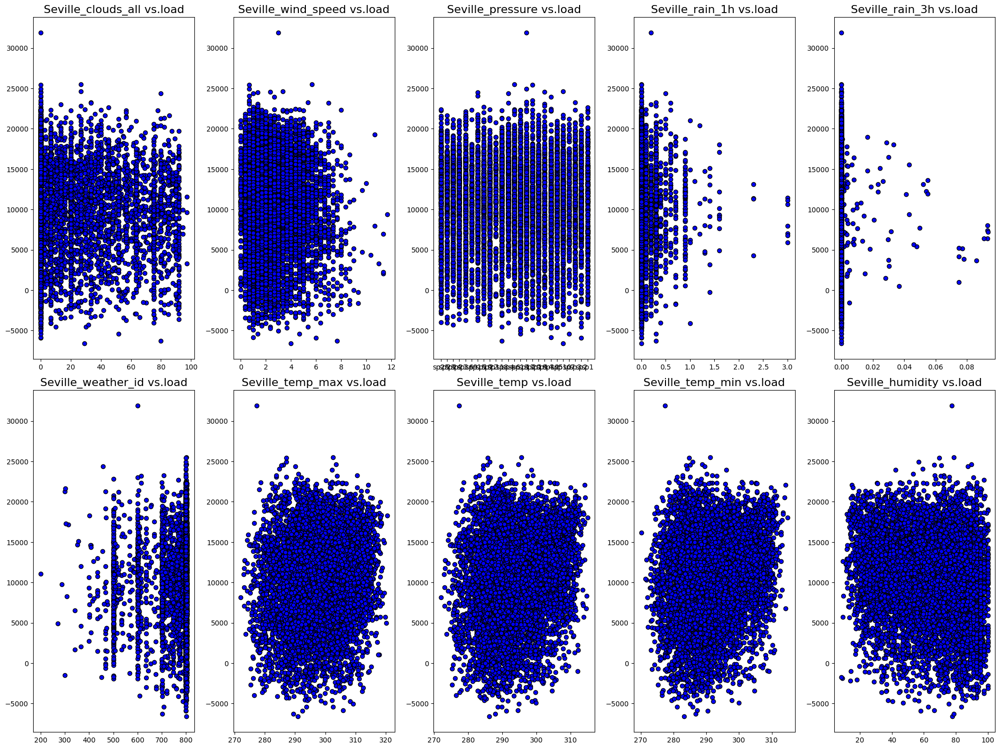

In [31]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Seville.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Let us make a use of the **PairPlot.**

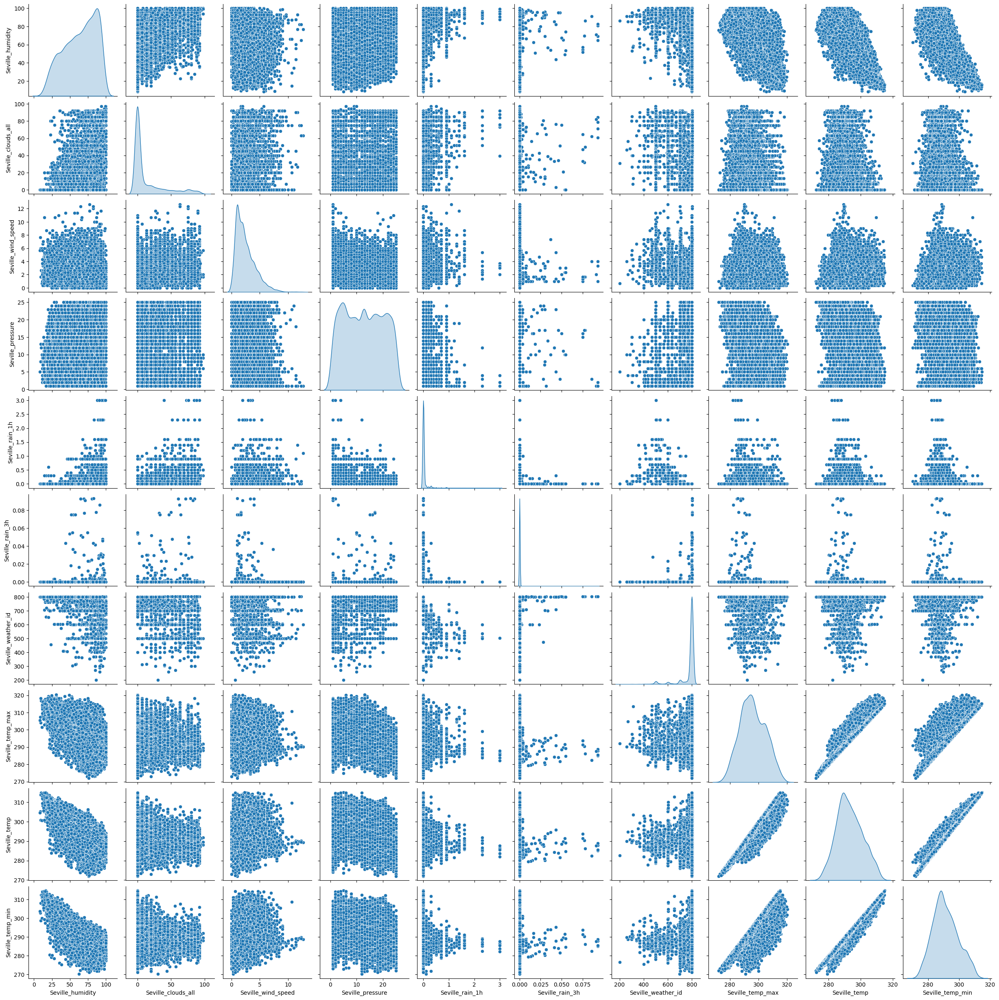

In [32]:
 
sns.pairplot(Seville, diag_kind='kde')


For us to handle any of the outliers, let's make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

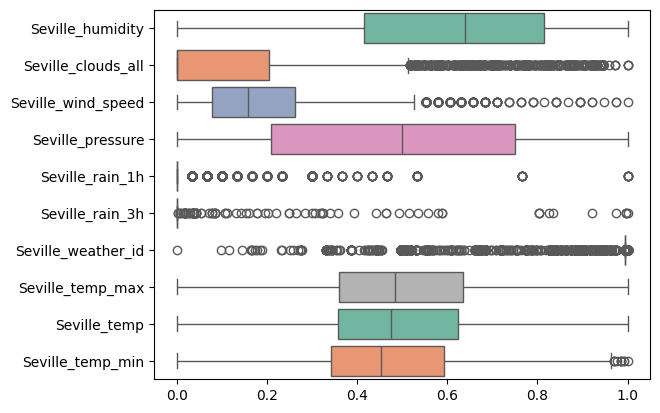

In [33]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Seville_ = pd.DataFrame(scaler.fit_transform(Seville), columns=Seville.columns)
sns.boxplot(data=Seville_, orient="h", palette="Set2")
#


In [34]:
# sns.histplot(Seville,kde=True)
#


Using the **heatmap**, let us assess the correlation of the **Seville** subset.

<Axes: >

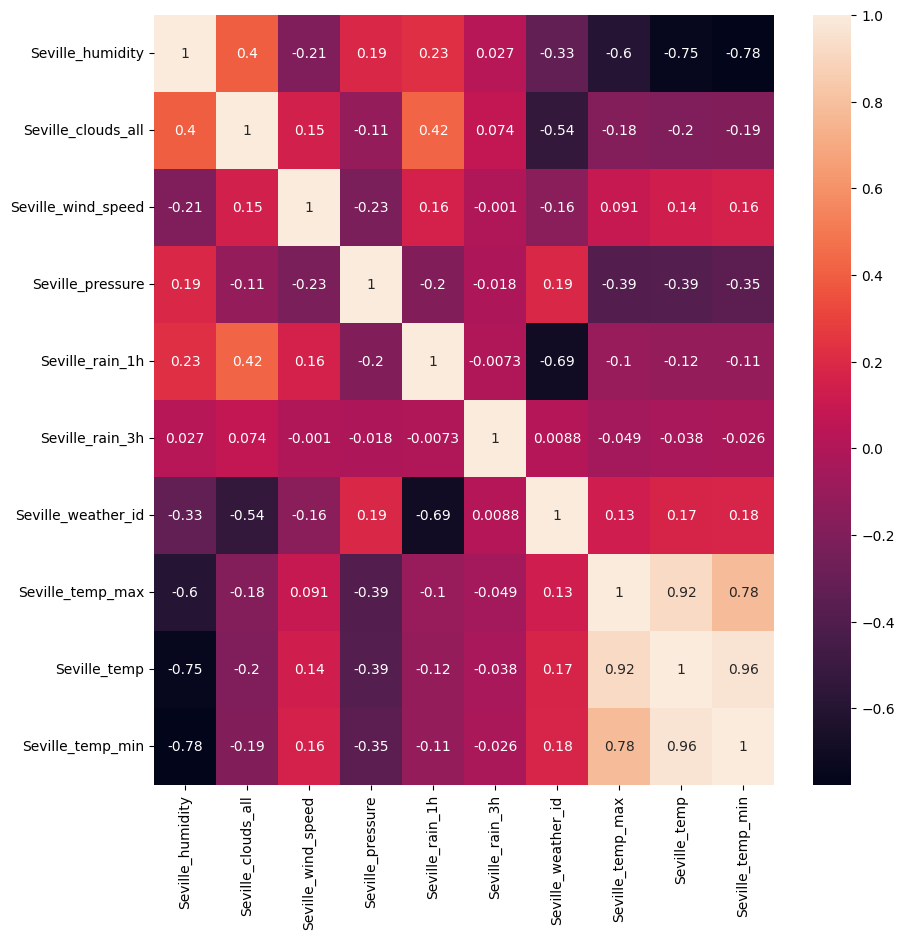

In [35]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Seville.corr(), annot=True)
#

- **The *Barcelona* City subset.**

In [36]:
### Assigning all Barcelona columns to a new variable.

Barcelona = df[[ 'Barcelona_wind_speed',
       'Barcelona_wind_deg',
         'Barcelona_rain_1h', 
        'Barcelona_pressure', 
        'Barcelona_rain_3h',
        'Barcelona_weather_id', 
        'Barcelona_temp_max',
          'Barcelona_temp',
       'Barcelona_temp_min']].copy()
Barcelona.head() 

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min
0,6.333333,42.666667,0.0,1036.333333,0.0,800.0,281.013000,281.013000,281.013000
1,4.000000,139.000000,0.0,1037.333333,0.0,800.0,280.561667,280.561667,280.561667
2,2.000000,326.000000,0.0,1038.000000,0.0,800.0,281.583667,281.583667,281.583667
3,2.333333,273.000000,0.0,1037.000000,0.0,800.0,283.434104,283.434104,283.434104
4,4.333333,260.000000,0.0,1035.000000,0.0,800.0,284.213167,284.213167,284.213167


Let's remove any outliers in the **Barcelona** subset above. In case there are any, so that we avoid them influencing our model.

In [37]:
### remove outliers
Barcelona[(np.abs(stats.zscore(Barcelona)) < 3).all(axis=1)]

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min
0,6.333333,42.666667,0.0,1036.333333,0.0,800.0,281.013000,281.013000,281.013000
1,4.000000,139.000000,0.0,1037.333333,0.0,800.0,280.561667,280.561667,280.561667
2,2.000000,326.000000,0.0,1038.000000,0.0,800.0,281.583667,281.583667,281.583667
3,2.333333,273.000000,0.0,1037.000000,0.0,800.0,283.434104,283.434104,283.434104
4,4.333333,260.000000,0.0,1035.000000,0.0,800.0,284.213167,284.213167,284.213167
...,...,...,...,...,...,...,...,...,...
2915,6.333333,320.000000,0.0,1029.666667,0.0,800.0,279.816667,278.140000,276.483333
2916,2.666667,293.333333,0.0,1028.666667,0.0,800.0,286.483333,286.150000,285.816667
2917,2.666667,233.333333,0.0,1027.000000,0.0,800.0,289.483333,288.820000,288.150000
2918,2.333333,253.333333,0.0,1027.000000,0.0,800.0,285.816667,284.473333,283.150000


Now let's assess the **Barcelona** data-types and also verify if are there any Null-values.

In [38]:
Barcelona.info()
# Barcelona.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Barcelona_wind_speed  11683 non-null  float64
 1   Barcelona_wind_deg    11683 non-null  float64
 2   Barcelona_rain_1h     11683 non-null  float64
 3   Barcelona_pressure    11683 non-null  float64
 4   Barcelona_rain_3h     11683 non-null  float64
 5   Barcelona_weather_id  11683 non-null  float64
 6   Barcelona_temp_max    11683 non-null  float64
 7   Barcelona_temp        11683 non-null  float64
 8   Barcelona_temp_min    11683 non-null  float64
dtypes: float64(9)
memory usage: 912.7 KB


Since we seem to have numerical data, let us perform some **Statical Analysis** (our five Number Summary).

In [39]:
Barcelona.describe()

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min
count,11683.000000,11683.000000,11683.000000,1.168300e+04,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000
mean,2.782419,187.654241,0.108534,1.287326e+03,0.000331,764.603446,291.042128,289.869413,288.616766
std,1.758587,88.694717,0.556794,1.218906e+04,0.003466,90.736191,7.236360,6.680538,6.391989
min,0.000000,0.000000,0.000000,6.706667e+02,0.000000,200.666667,272.150000,270.816667,269.483333
25%,1.333333,116.666667,0.000000,1.013667e+03,0.000000,800.000000,285.338609,284.816667,284.150000
50%,2.333333,193.333333,0.000000,1.017333e+03,0.000000,800.000000,290.150000,289.426667,288.276333
75%,3.666667,260.000000,0.000000,1.021167e+03,0.000000,801.000000,296.816667,295.150000,293.483333
max,12.666667,360.000000,12.000000,1.001411e+06,0.093000,804.000000,314.076667,308.150000,306.816667


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends

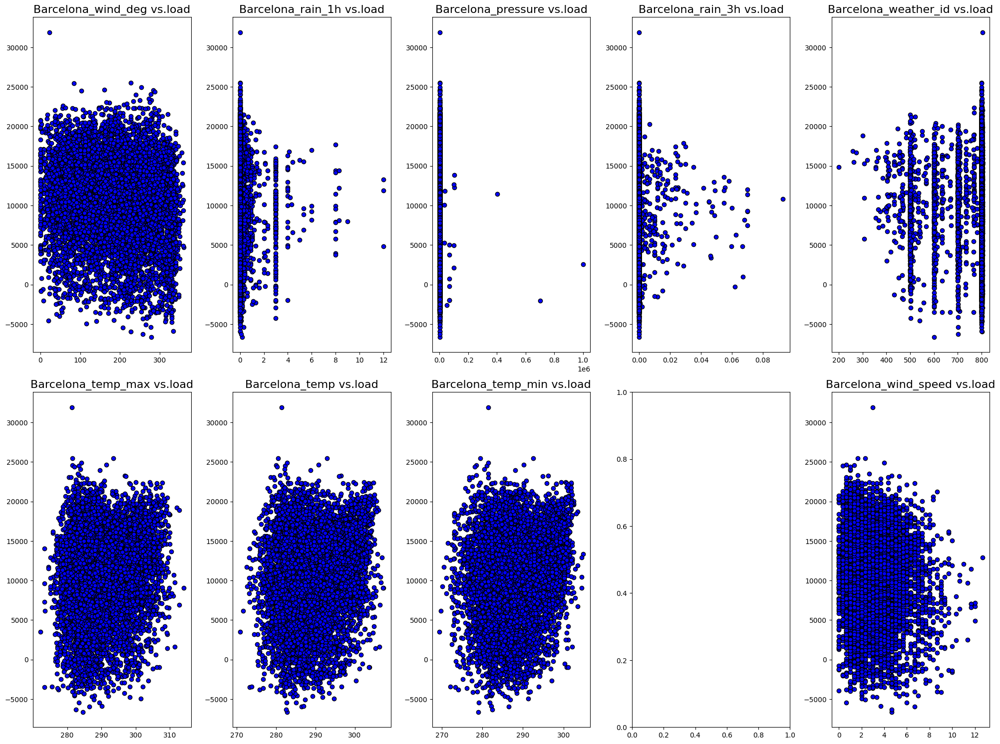

In [40]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Barcelona.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Since the **Barcelona** subset is in a Numerical format, let's make a use of the **PairPlot**.

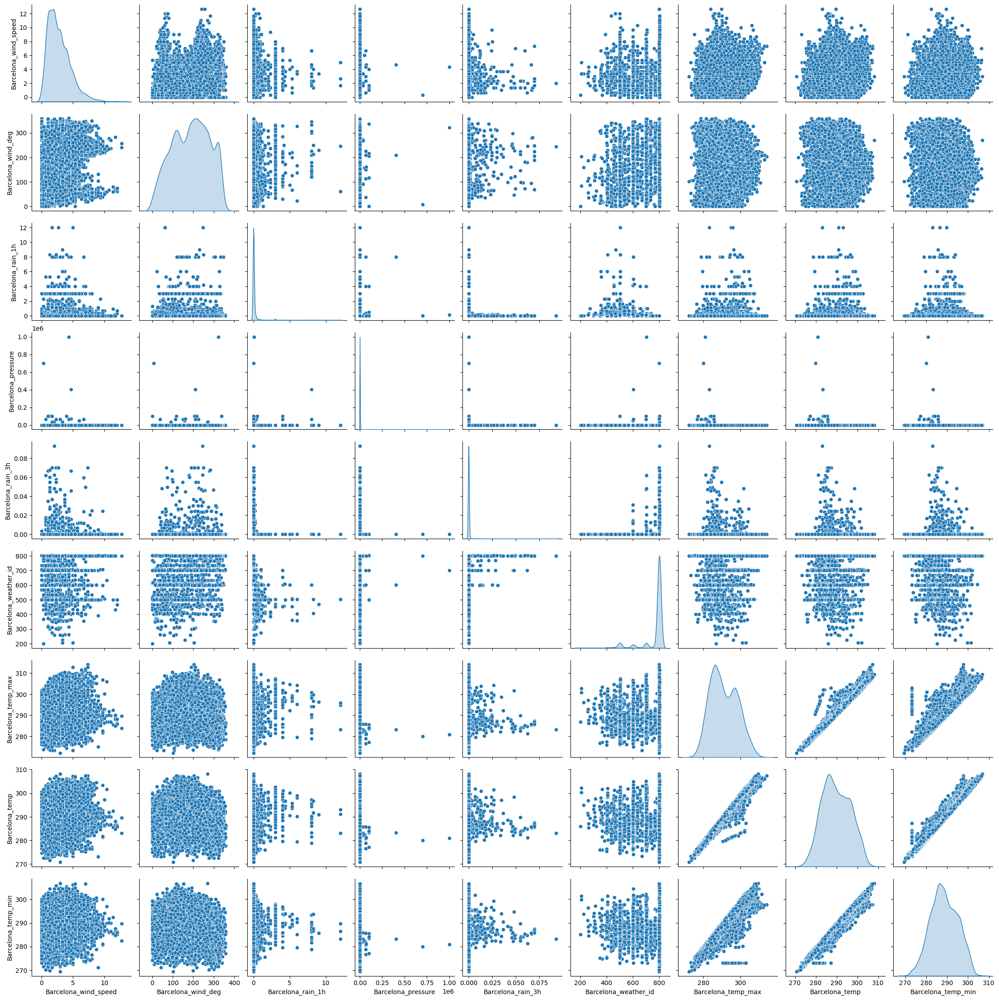

In [41]:
#
sns.pairplot(Barcelona, diag_kind='kde')
#


For us to handle any of the outliers, let's make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

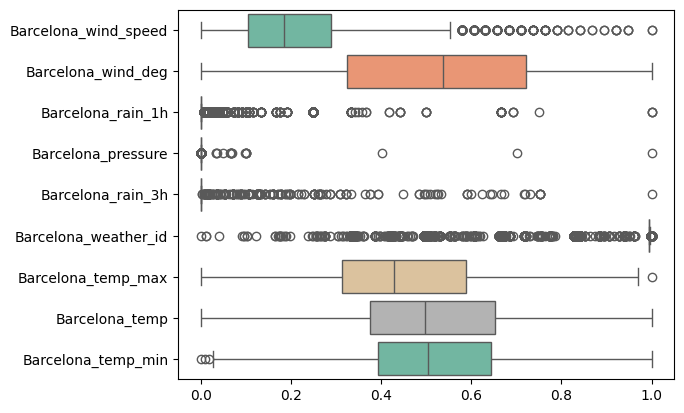

In [42]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Barcelona_ = pd.DataFrame(scaler.fit_transform(Barcelona), columns=Barcelona.columns)
sns.boxplot(data=Barcelona_, orient="h", palette="Set2")


In [43]:
#
# sns.histplot(Barcelona,kde=True)


Using the **heatmap** now let us assess the correlation of the **Barcelona** subset.

<Axes: >

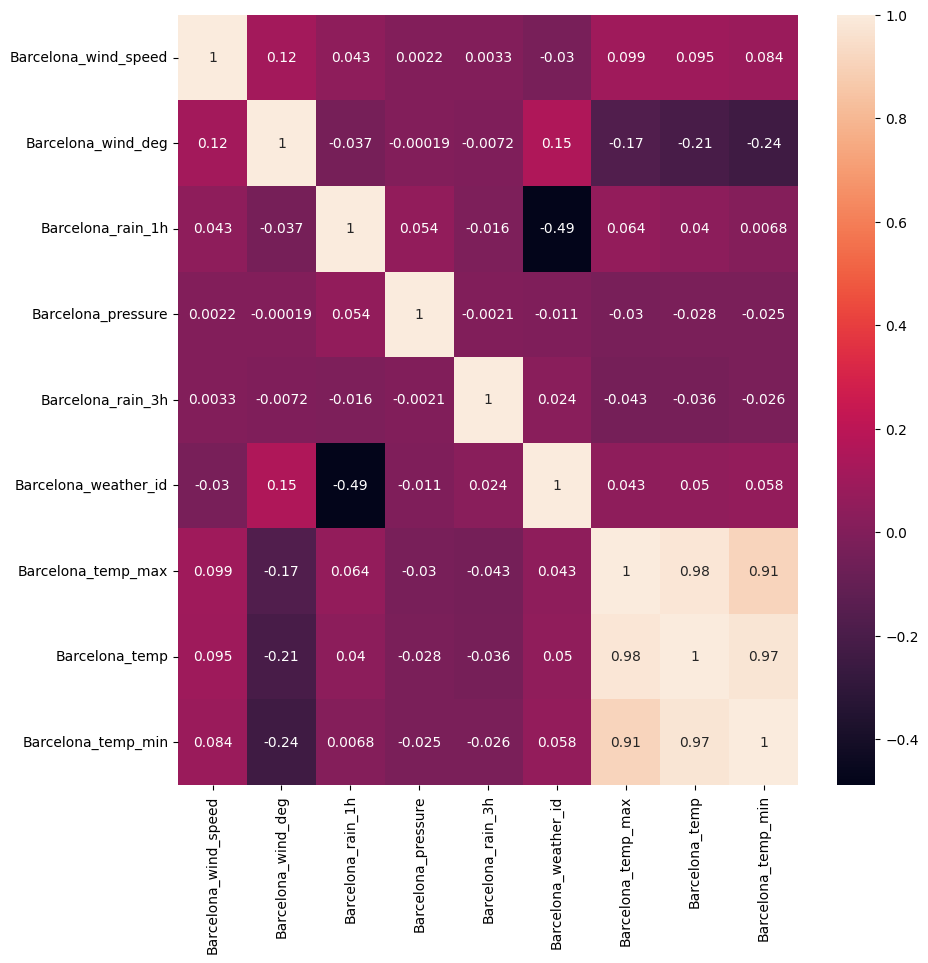

In [44]:
#
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Barcelona.corr(), annot=True)
#

- **The *Valencia* City subset.**

In [45]:
### Assigning all Valencia columns to a new variable.

Valencia = df[['Valencia_wind_speed',
               'Valencia_wind_deg',
               'Valencia_humidity',
                'Valencia_snow_3h',
                'Valencia_pressure',
              'Valencia_temp_max',
               'Valencia_temp',
               'Valencia_temp_min']].copy()
Valencia.head()

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
0,0.666667,level_5,75.666667,0.0,1002.666667,269.888000,269.888000,269.888000
1,1.666667,level_10,71.000000,0.0,1004.333333,271.728333,271.728333,271.728333
2,1.000000,level_9,65.666667,0.0,1005.333333,278.008667,278.008667,278.008667
3,1.000000,level_8,54.000000,0.0,1009.000000,284.899552,284.899552,284.899552
4,1.000000,level_7,58.333333,0.0,NaN,283.015115,283.015115,283.015115


With the results above, taking look at the **Valencia_pressure** column row number 4. There is a missing value, so now lets perform an in depth analysis for the missing values within the **Valencia** subset.

In [46]:
### Valencia_pressure has 2068 out of 8763 total values missing
Valencia['Valencia_pressure'].fillna(Valencia['Valencia_pressure'].median(), inplace=True) # mean = 1012.0514065222798  , mode = 1018 , median = 1015

In [47]:
Valencia.head()

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
0,0.666667,level_5,75.666667,0.0,1002.666667,269.888000,269.888000,269.888000
1,1.666667,level_10,71.000000,0.0,1004.333333,271.728333,271.728333,271.728333
2,1.000000,level_9,65.666667,0.0,1005.333333,278.008667,278.008667,278.008667
3,1.000000,level_8,54.000000,0.0,1009.000000,284.899552,284.899552,284.899552
4,1.000000,level_7,58.333333,0.0,1015.000000,283.015115,283.015115,283.015115


Now our problem with the missing values is resolved. So looking at the column **Valencia_wind_deg**, the column consist of the **Object** datatype. So let us convert it into a **Numerical** datatype format.

In [48]:
### reformatting the data to the correct type
Valencia['Valencia_wind_deg'] = Valencia['Valencia_wind_deg'].astype(str).str.extract('(\d+)', expand=False).astype(int)

Now let's verify the column **Valencia_wind_deg** datatype has been converted succesfully and also get rid of the outliers if there are any, so the we avoid them influencing the overall distribution.

In [49]:
Valencia.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Valencia_wind_speed  11683 non-null  float64
 1   Valencia_wind_deg    11683 non-null  int64  
 2   Valencia_humidity    11683 non-null  float64
 3   Valencia_snow_3h     11683 non-null  float64
 4   Valencia_pressure    11683 non-null  float64
 5   Valencia_temp_max    11683 non-null  float64
 6   Valencia_temp        11683 non-null  float64
 7   Valencia_temp_min    11683 non-null  float64
dtypes: float64(7), int64(1)
memory usage: 821.5 KB


In [50]:
### remove outliers
Valencia[(np.abs(stats.zscore(Valencia)) < 3).all(axis=1)]

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
0,0.666667,5,75.666667,0.0,1002.666667,269.888000,269.888000,269.888000
1,1.666667,10,71.000000,0.0,1004.333333,271.728333,271.728333,271.728333
2,1.000000,9,65.666667,0.0,1005.333333,278.008667,278.008667,278.008667
3,1.000000,8,54.000000,0.0,1009.000000,284.899552,284.899552,284.899552
4,1.000000,7,58.333333,0.0,1015.000000,283.015115,283.015115,283.015115
...,...,...,...,...,...,...,...,...
2915,2.000000,9,69.666667,0.0,1015.000000,279.816667,279.323333,278.816667
2916,1.333333,8,32.000000,0.0,1015.000000,290.816667,290.323333,289.816667
2917,3.000000,6,23.666667,0.0,1015.000000,293.483333,293.483333,293.483333
2918,2.000000,6,59.000000,0.0,1015.000000,286.483333,285.976667,285.483333


Now tha we managed to handle the *Missing values, Outliers and the correct format of the datatype*, let us perform some **Statical Analysis** (our five Number Summary).

In [51]:
Valencia.describe()

,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_temp_min
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000
mean,2.692873,5.476590,65.091814,0.000154,1012.919456,291.362722,290.788513,290.229939
std,2.321759,2.863384,19.040927,0.010277,7.883832,7.441278,7.157835,7.003619
min,0.000000,1.000000,10.333333,0.000000,972.666667,269.888000,269.888000,269.888000
25%,1.000000,3.000000,51.333333,0.000000,1012.333333,285.783333,285.395500,284.928833
50%,2.000000,5.000000,66.333333,0.000000,1015.000000,291.150000,290.483333,289.820000
75%,3.666667,8.000000,80.666667,0.000000,1017.000000,297.159167,296.437500,295.491667
max,52.000000,10.000000,100.000000,0.791667,1021.666667,314.263333,310.426667,310.272000


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

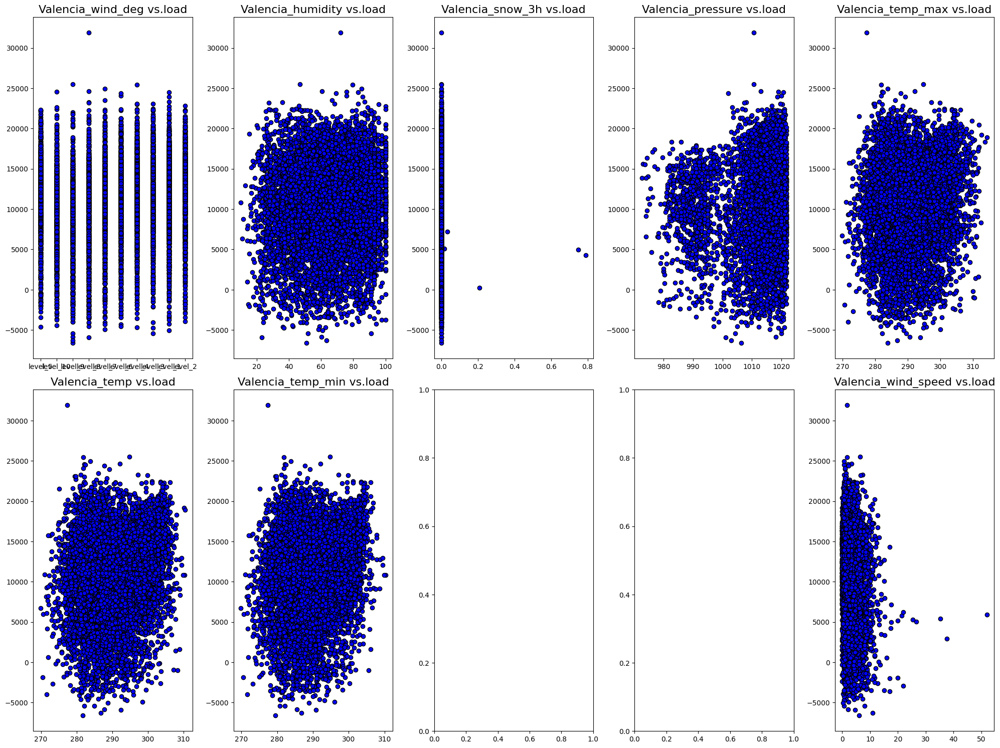

In [52]:
fig, axs = plt.subplots(2,5, figsize=(20,15),)
fig.subplots_adjust(hspace = 0.5, wspace=.2)
axs = axs.ravel()

for index, column in enumerate(Valencia.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Our **Valencia** subset is now in a Numerical format, let's make a use of the PairPlot.

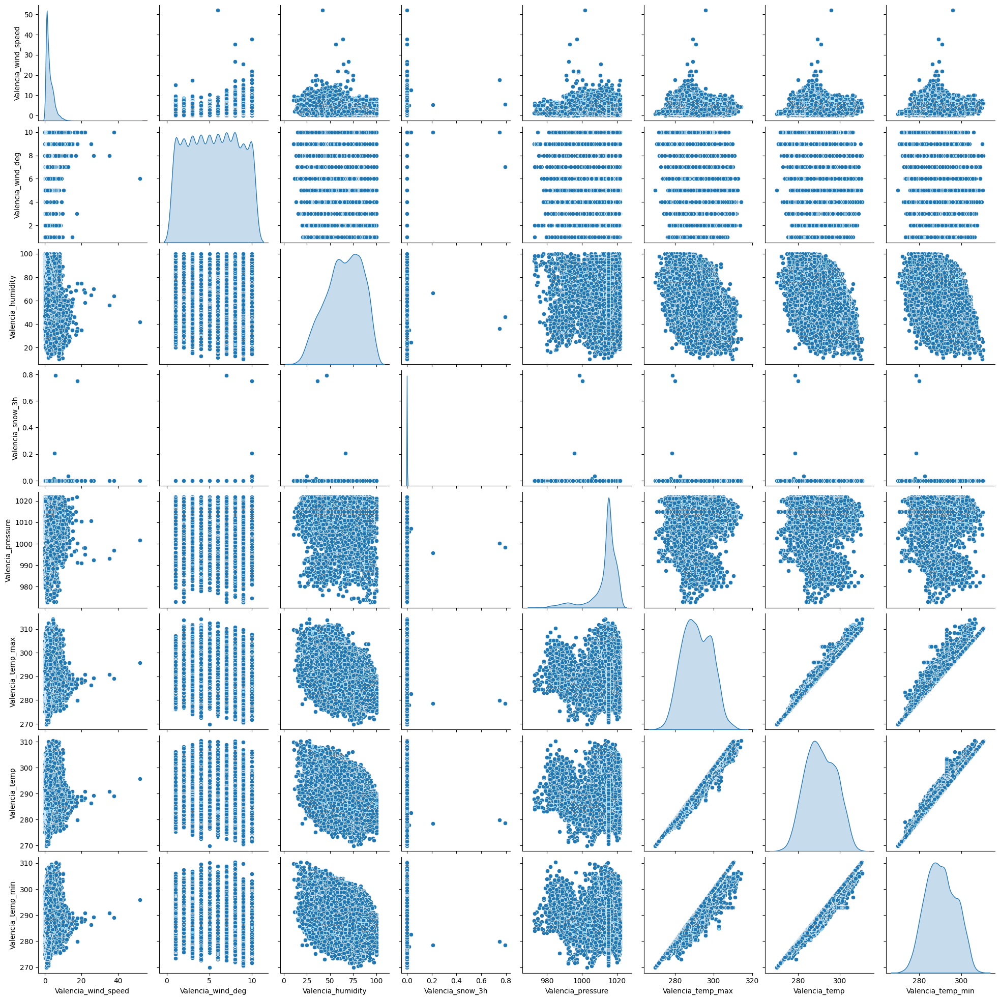

In [53]:
#
sns.pairplot(Valencia, diag_kind='kde')
#


Let us make a use of **MinMaxScaler** so that it helps us by reducing their influence on the overall data distribution.

<Axes: >

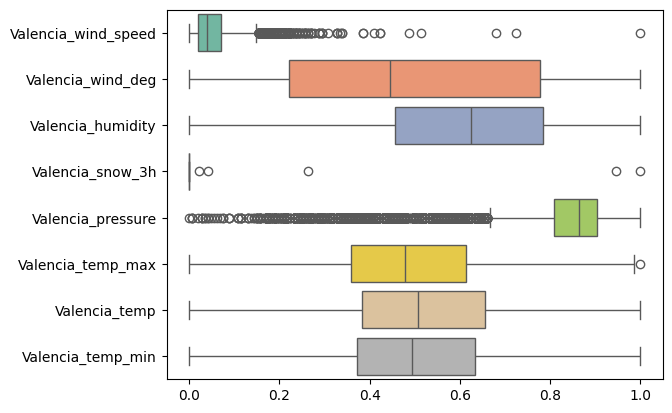

In [54]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Valencia_ = pd.DataFrame(scaler.fit_transform(Valencia), columns=Valencia.columns)
sns.boxplot(data=Valencia_, orient="h", palette="Set2")
#


In [55]:
# sns.histplot(Valencia,kde=True)
#


Using the **heatmap** let us assess the correlation of the **Valencia** subset.

<Axes: >

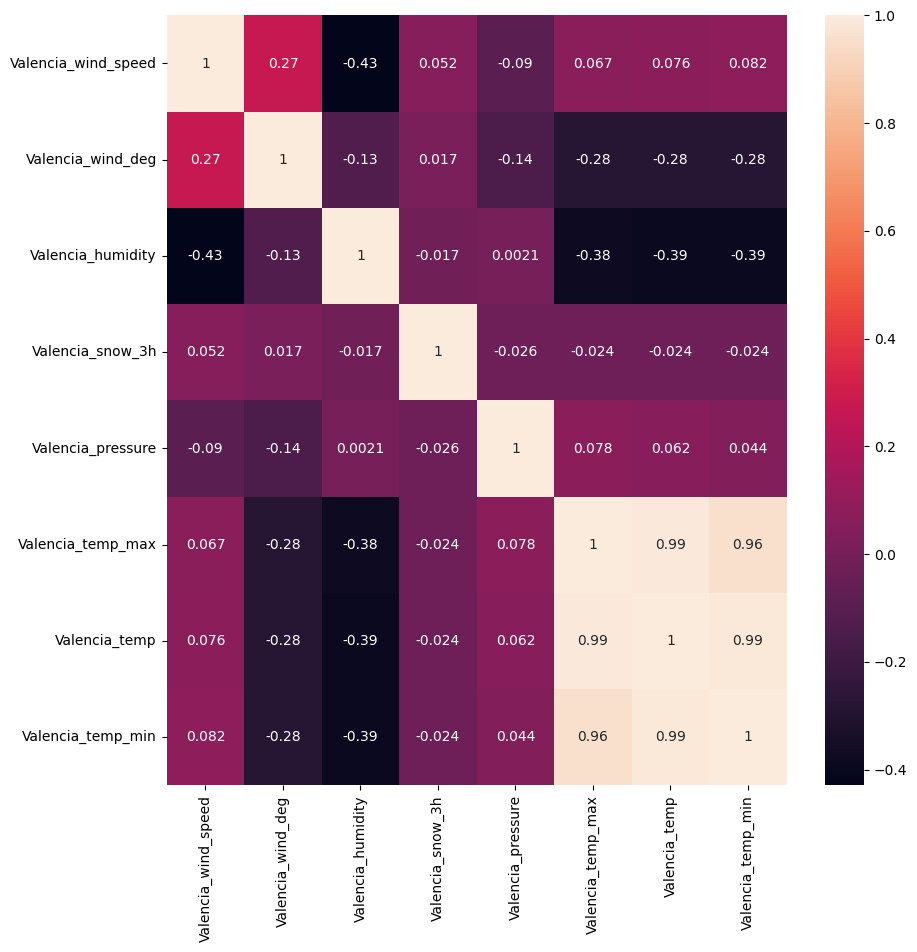

In [56]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Valencia.corr(), annot=True)
#

- **The *Bilbao* City subset.**

In [57]:
### Assigning all Madrid columns to a new variable.

Bilbao = df[['Bilbao_wind_speed',
             'Bilbao_wind_deg',
             'Bilbao_clouds_all',
             'Bilbao_pressure',
               'Bilbao_rain_1h',
               'Bilbao_snow_3h',
               'Bilbao_weather_id',
             'Bilbao_temp_max',
             'Bilbao_temp',
             'Bilbao_temp_min']]
Bilbao.head()

,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_weather_id,Bilbao_temp_max,Bilbao_temp,Bilbao_temp_min
0,1.000000,223.333333,0.0,1035.000000,0.0,0.0,800.0,269.338615,269.338615,269.338615
1,1.000000,221.000000,0.0,1035.666667,0.0,0.0,800.0,270.376000,270.376000,270.376000
2,1.000000,214.333333,0.0,1036.000000,0.0,0.0,800.0,275.027229,275.027229,275.027229
3,1.000000,199.666667,0.0,1036.000000,0.0,0.0,800.0,281.135063,281.135063,281.135063
4,0.333333,185.000000,2.0,1035.333333,0.0,0.0,800.0,282.252063,282.252063,282.252063


Let's remove any outliers in the **Bilbao** subset above. In case there are any, so that we avoid them influencing our model.

In [58]:
### remove outliers
Bilbao[(np.abs(stats.zscore(Bilbao)) < 3).all(axis=1)]

,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_weather_id,Bilbao_temp_max,Bilbao_temp,Bilbao_temp_min
0,1.000000,223.333333,0.000000,1035.000000,0.0,0.0,800.000000,269.338615,269.338615,269.338615
1,1.000000,221.000000,0.000000,1035.666667,0.0,0.0,800.000000,270.376000,270.376000,270.376000
2,1.000000,214.333333,0.000000,1036.000000,0.0,0.0,800.000000,275.027229,275.027229,275.027229
3,1.000000,199.666667,0.000000,1036.000000,0.0,0.0,800.000000,281.135063,281.135063,281.135063
4,0.333333,185.000000,2.000000,1035.333333,0.0,0.0,800.000000,282.252063,282.252063,282.252063
...,...,...,...,...,...,...,...,...,...,...
2915,1.333333,70.000000,80.000000,1034.666667,0.0,0.0,734.333333,276.150000,273.210000,270.816667
2916,1.000000,36.666667,56.666667,1034.333333,0.0,0.0,747.666667,278.816667,278.443333,278.150000
2917,0.666667,14.666667,0.000000,1033.000000,0.0,0.0,800.000000,285.816667,285.073333,284.150000
2918,0.666667,19.000000,0.000000,1033.333333,0.0,0.0,800.000000,282.816667,281.626667,280.150000


Now let's assess the **Bilbao** datatypes and also verify if are there any Null-values

In [59]:
Bilbao.info()
### Bilbao.isnull()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Bilbao_wind_speed  11683 non-null  float64
 1   Bilbao_wind_deg    11683 non-null  float64
 2   Bilbao_clouds_all  11683 non-null  float64
 3   Bilbao_pressure    11683 non-null  float64
 4   Bilbao_rain_1h     11683 non-null  float64
 5   Bilbao_snow_3h     11683 non-null  float64
 6   Bilbao_weather_id  11683 non-null  float64
 7   Bilbao_temp_max    11683 non-null  float64
 8   Bilbao_temp        11683 non-null  float64
 9   Bilbao_temp_min    11683 non-null  float64
dtypes: float64(10)
memory usage: 1004.0 KB


Since our data is in a correct format, let us perform some **Statical Analysis** (our five Number Summary).

In [60]:
Bilbao.describe().T

,count,mean,std,min,25%,50%,75%,max
Bilbao_wind_speed,11683.0,1.958629,1.696043,0.000000,1.000000,1.333333,2.666667,12.666667
Bilbao_wind_deg,11683.0,159.878855,101.005654,0.000000,76.666667,145.666667,233.333333,360.000000
Bilbao_clouds_all,11683.0,43.440712,32.046215,0.000000,12.000000,45.000000,75.000000,100.000000
Bilbao_pressure,11683.0,1017.482011,9.753552,971.333333,1013.333333,1018.666667,1023.333333,1042.000000
Bilbao_rain_1h,11683.0,0.118698,0.334918,0.000000,0.000000,0.000000,0.100000,3.000000
Bilbao_snow_3h,11683.0,0.023936,0.482817,0.000000,0.000000,0.000000,0.000000,21.300000
Bilbao_weather_id,11683.0,727.800750,113.616789,207.333333,701.000000,800.000000,801.666667,804.000000
Bilbao_temp_max,11683.0,288.095397,6.898601,269.063000,283.150000,287.816667,292.483333,317.966667
Bilbao_temp,11683.0,286.447784,6.738466,267.483333,281.483448,286.193333,291.040000,310.710000
Bilbao_temp_min,11683.0,284.993657,6.730076,264.483333,280.122526,284.816667,289.816667,309.816667


Now let us head on to **Graphical Analysis** so that we study the patterns, correlations, and trends.

In [61]:
for index, column in enumerate(Bilbao.columns):
    axs[index-1].set_title("{} vs.load".format(column),fontsize=16)
    axs[index-1].scatter(x=df[column],y=df['load_shortfall_3h'],color='blue',edgecolor='k')

fig.tight_layout(pad=1)



Now that we have performed the **Statical Aanalysis** to the **Bilbao** subset is in a Numerical format, let's make a use of the **PairPlot**.

MinMaxScaler()

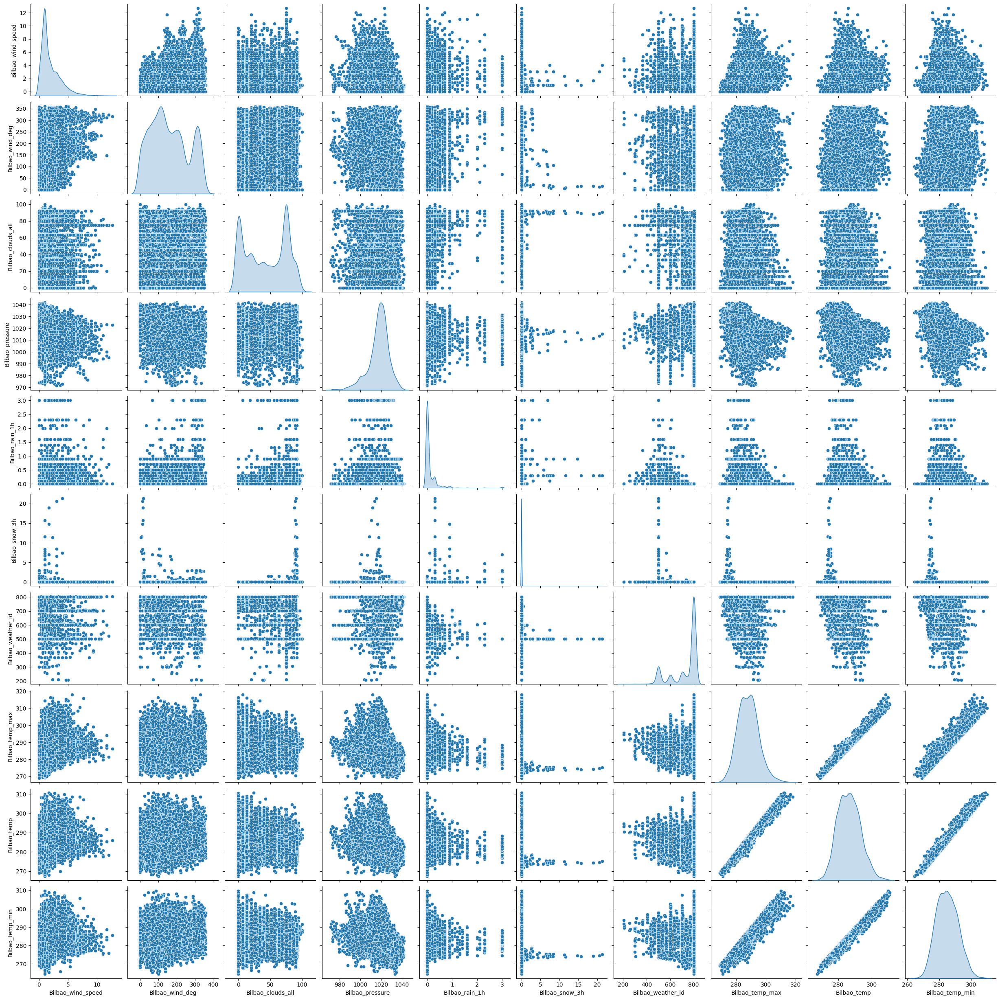

In [62]:

sns.pairplot(Bilbao, diag_kind='kde')
MinMaxScaler()


Let us make a use of **MinMaxScaler** so that it helps us by reducing on their influence on the overall data distribution.

<Axes: >

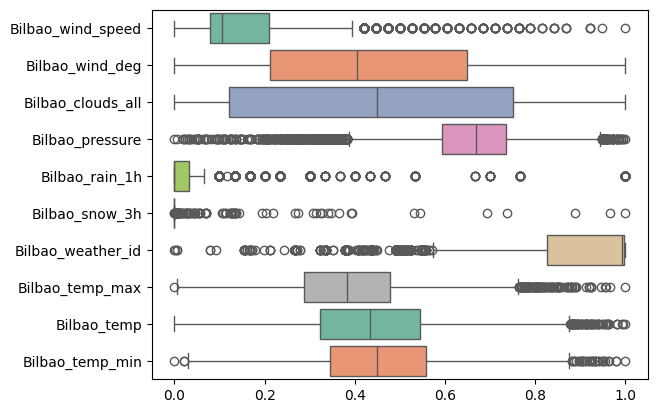

In [63]:
# Create an instance of the MinMaxScaler
scaler = MinMaxScaler()
# Scale the independent variables and create a DataFrame
Bilbao_ = pd.DataFrame(scaler.fit_transform(Bilbao), columns=Bilbao.columns)
sns.boxplot(data=Bilbao_, orient="h", palette="Set2")
#

#

Using the **heatmap**, let us assess the correlation of the **Bilbao** subset.

<Axes: >

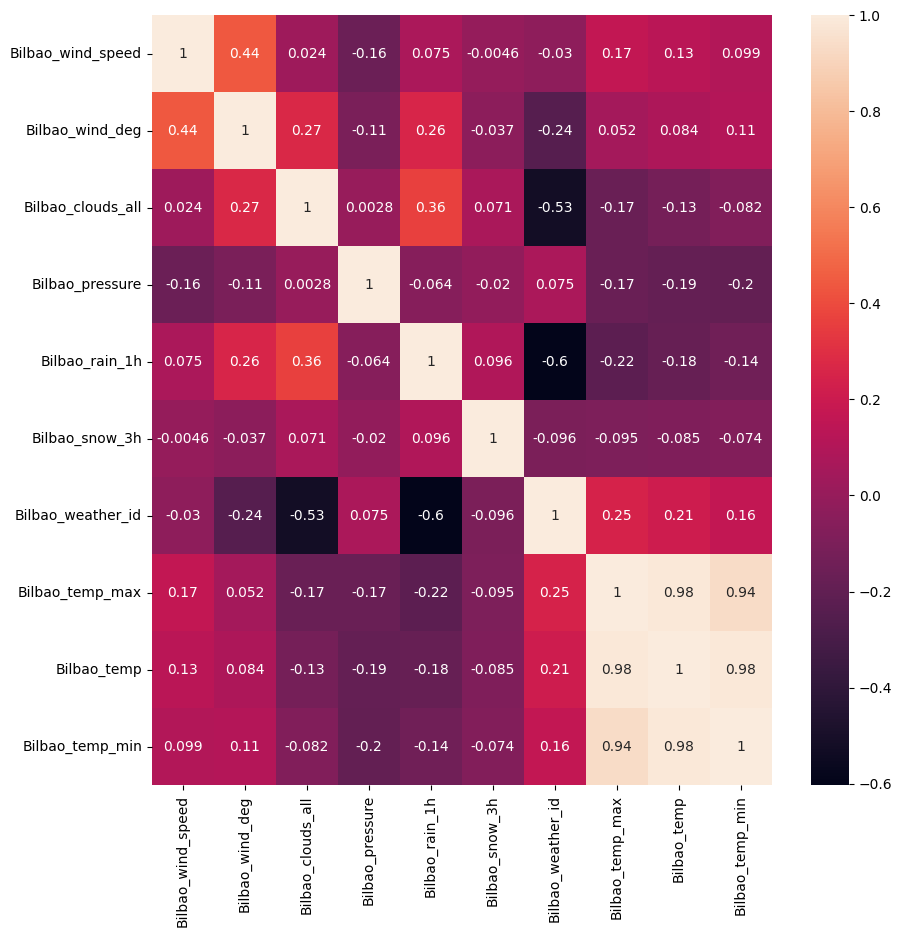

In [64]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Bilbao.corr(), annot=True)

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

On **heatmap** we created when performing the **EDA** of the entire dataset, there was a high correlation between the **Temperature** *columns*. So now let us analyse that.

In [65]:
## Creating a subset for the Temperature columns
# Temp = df[['Madrid_temp','Madrid_temp_min','Madrid_temp_max',
#            'Bilbao_temp','Bilbao_temp_min','Bilbao_temp_max',
#            'Barcelona_temp','Barcelona_temp_min','Barcelona_temp_max',
#            'Valencia_temp','Valencia_temp_min','Valencia_temp_max',
#            'Seville_temp','Seville_temp_min','Seville_temp_max']].copy()

Using the **heatmap**, let us assess the *correlation*.

In [66]:
# fig, ax = plt.subplots(figsize=(15, 15))
# sns.heatmap(Temp.corr(), annot=True)

Now let us group them and try to understand the structure of the data as well.

In [67]:
data = pd.concat([df['time'],Madrid, Seville, Barcelona, Valencia, Bilbao], axis=1)
data.info()
# data_temp = pd.concat([df['time'],Madrid, Seville, Barcelona, Valencia, Bilbao, df['load_shortfall_3h']], axis=1)


<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 47 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   time                  11683 non-null  object 
 1   Madrid_wind_speed     11683 non-null  float64
 2   Madrid_humidity       11683 non-null  float64
 3   Madrid_clouds_all     11683 non-null  float64
 4   Madrid_pressure       11683 non-null  float64
 5   Madrid_rain_1h        11683 non-null  float64
 6   Madrid_weather_id     11683 non-null  float64
 7   Madrid_temp_min       11683 non-null  float64
 8   Madrid_temp           11683 non-null  float64
 9   Madrid_temp_max       11683 non-null  float64
 10  Seville_humidity      11683 non-null  float64
 11  Seville_clouds_all    11683 non-null  float64
 12  Seville_wind_speed    11683 non-null  float64
 13  Seville_pressure      11683 non-null  int64  
 14  Seville_rain_1h       11683 non-null  float64
 15  Seville_rain_3h       116

As we have a **time** *column* in our data, let us convert it to a correct format in way that is easier for us to read.
Its also important to  note that this train does not have the load shortfall feature

In [68]:
Train = data.copy()

Train['time'] = pd.to_datetime(Train['time'])

Train['Day'] = Train['time'].dt.day
Train['Month'] = Train['time'].dt.month
Train['Year'] = Train['time'].dt.year
Train['Hour'] = Train['time'].dt.hour

Train.info()

Train = Train [['Year','Month','Day','Hour','Madrid_wind_speed', 'Madrid_humidity', 'Madrid_clouds_all',
       'Madrid_pressure', 'Madrid_rain_1h', 'Madrid_weather_id', 'Madrid_temp',
       'Seville_humidity', 'Seville_clouds_all', 'Seville_wind_speed',
       'Seville_pressure', 'Seville_rain_1h', 'Seville_rain_3h',
       'Seville_weather_id', 'Seville_temp', 'Barcelona_wind_speed',
       'Barcelona_wind_deg', 'Barcelona_rain_1h', 'Barcelona_pressure',
       'Barcelona_rain_3h', 'Barcelona_weather_id', 'Barcelona_temp',
       'Valencia_wind_speed', 'Valencia_wind_deg', 'Valencia_humidity',
       'Valencia_snow_3h', 'Valencia_pressure', 'Valencia_temp',
       'Bilbao_wind_speed', 'Bilbao_wind_deg', 'Bilbao_clouds_all',
       'Bilbao_pressure', 'Bilbao_rain_1h', 'Bilbao_snow_3h',
       'Bilbao_weather_id', 'Bilbao_temp']]



<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 51 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   time                  11683 non-null  datetime64[ns]
 1   Madrid_wind_speed     11683 non-null  float64       
 2   Madrid_humidity       11683 non-null  float64       
 3   Madrid_clouds_all     11683 non-null  float64       
 4   Madrid_pressure       11683 non-null  float64       
 5   Madrid_rain_1h        11683 non-null  float64       
 6   Madrid_weather_id     11683 non-null  float64       
 7   Madrid_temp_min       11683 non-null  float64       
 8   Madrid_temp           11683 non-null  float64       
 9   Madrid_temp_max       11683 non-null  float64       
 10  Seville_humidity      11683 non-null  float64       
 11  Seville_clouds_all    11683 non-null  float64       
 12  Seville_wind_speed    11683 non-null  float64       
 13  Seville_pressure      

In [69]:
# Create temp variable 
temp_Train = pd.merge(Train, df['load_shortfall_3h'], left_index=True, right_index=True)
temp_Train.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Madrid_wind_speed', 'Madrid_humidity',
       'Madrid_clouds_all', 'Madrid_pressure', 'Madrid_rain_1h',
       'Madrid_weather_id', 'Madrid_temp', 'Seville_humidity',
       'Seville_clouds_all', 'Seville_wind_speed', 'Seville_pressure',
       'Seville_rain_1h', 'Seville_rain_3h', 'Seville_weather_id',
       'Seville_temp', 'Barcelona_wind_speed', 'Barcelona_wind_deg',
       'Barcelona_rain_1h', 'Barcelona_pressure', 'Barcelona_rain_3h',
       'Barcelona_weather_id', 'Barcelona_temp', 'Valencia_wind_speed',
       'Valencia_wind_deg', 'Valencia_humidity', 'Valencia_snow_3h',
       'Valencia_pressure', 'Valencia_temp', 'Bilbao_wind_speed',
       'Bilbao_wind_deg', 'Bilbao_clouds_all', 'Bilbao_pressure',
       'Bilbao_rain_1h', 'Bilbao_snow_3h', 'Bilbao_weather_id', 'Bilbao_temp',
       'load_shortfall_3h'],
      dtype='object')

Below we did a visual for the load shortfall of 3-hour period spanning 4 years.

Text(0.5, 1.0, 'Total load shortfall_3h per year')

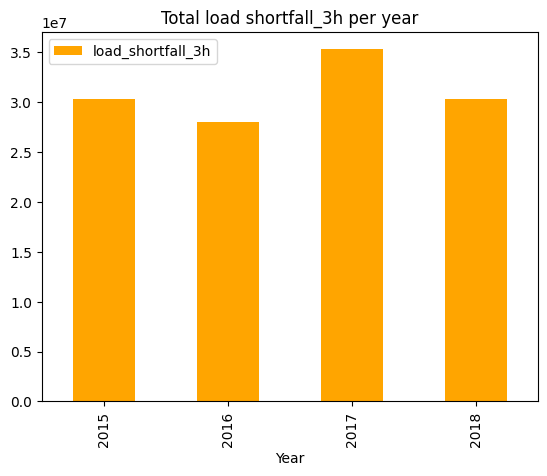

In [70]:
temp_Train[['Year',
 'load_shortfall_3h']].groupby('Year').sum().plot.bar(color='orange')
plt.title('Total load shortfall_3h per year')


We can tell from the above that year 2017 had the most occurences of load shortfall_h

<h3>Below we showed the load shortfall for each of the highlighted years above</h3>


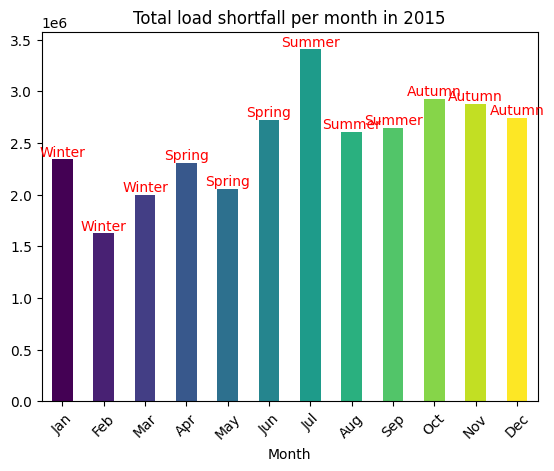

In [71]:
import calendar


# Map months to seasons
def get_season(month):
    if month in [1,2,3]:
        return 'Winter'
    elif month in [4, 5, 6]:
        return 'Spring'
    elif month in [7, 8, 9]:
        return 'Summer'
    else:
        return 'Autumn'

# Filter the data for the year
temp_2015 = temp_Train[temp_Train['Year'] == 2015]

# Group by month and calculate the sum of load shortfall for each month
monthly_load_shortfall = temp_2015.groupby('Month')['load_shortfall_3h'].sum()

# Define a colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(monthly_load_shortfall)))

# Plot the data
ax = monthly_load_shortfall.plot(kind='bar', color=colors)

# Customize the x-axis tick labels
ax.set_xticklabels([calendar.month_abbr[m] for m in range(1, 13)], rotation=45)

# Add season labels
for month in range(1, 13):
    season = get_season(month)
    plt.text(month - 1, monthly_load_shortfall[month], season, ha='center', va='bottom', color='red')

# Set the title
plt.title('Total load shortfall per month in 2015')

# Show the plot
plt.show()

Looking at the above graph we can see that Summer and Autumn seasons had the most load shortfall that year, also July has the highest total of load shortfall that year

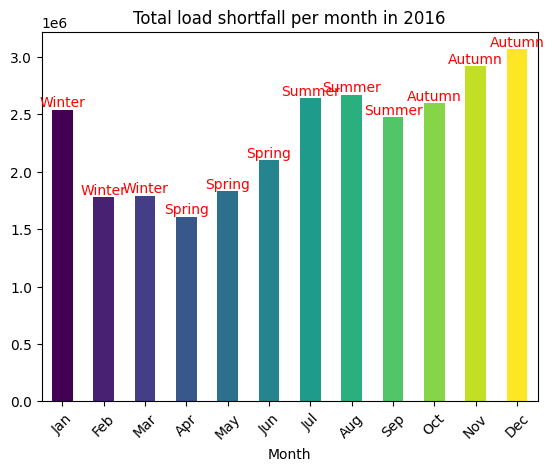

In [72]:
import calendar


# Map months to seasons
def get_season(month):
    if month in [1,2,3]:
        return 'Winter'
    elif month in [4, 5, 6]:
        return 'Spring'
    elif month in [7, 8, 9]:
        return 'Summer'
    else:
        return 'Autumn'

# Filter the data for the year
temp_2016 = temp_Train[temp_Train['Year'] == 2016]

# Group by month and calculate the sum of load shortfall for each month
monthly_load_shortfall = temp_2016.groupby('Month')['load_shortfall_3h'].sum()

# Define a colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(monthly_load_shortfall)))

# Plot the data
ax = monthly_load_shortfall.plot(kind='bar', color=colors)

# Customize the x-axis tick labels
ax.set_xticklabels([calendar.month_abbr[m] for m in range(1, 13)], rotation=45)

# Add season labels
for month in range(1, 13):
    season = get_season(month)
    plt.text(month - 1, monthly_load_shortfall[month], season, ha='center', va='bottom', color='red')

# Set the title
plt.title('Total load shortfall per month in 2016')

# Show the plot
plt.show()

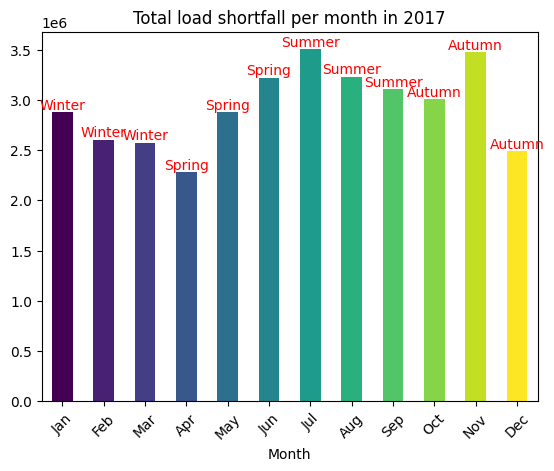

In [73]:
import calendar


# Map months to seasons
def get_season(month):
    if month in [1,2,3]:
        return 'Winter'
    elif month in [4, 5, 6]:
        return 'Spring'
    elif month in [7, 8, 9]:
        return 'Summer'
    else:
        return 'Autumn'

# Filter the data for the year
temp_2017 = temp_Train[temp_Train['Year'] == 2017]

# Group by month and calculate the sum of load shortfall for each month
monthly_load_shortfall = temp_2017.groupby('Month')['load_shortfall_3h'].sum()

# Define a colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(monthly_load_shortfall)))

# Plot the data
ax = monthly_load_shortfall.plot(kind='bar', color=colors)

# Customize the x-axis tick labels
ax.set_xticklabels([calendar.month_abbr[m] for m in range(1, 13)], rotation=45)

# Add season labels
for month in range(1, 13):
    season = get_season(month)
    plt.text(month - 1, monthly_load_shortfall[month], season, ha='center', va='bottom', color='red')

# Set the title
plt.title('Total load shortfall per month in 2017')

# Show the plot
plt.show()

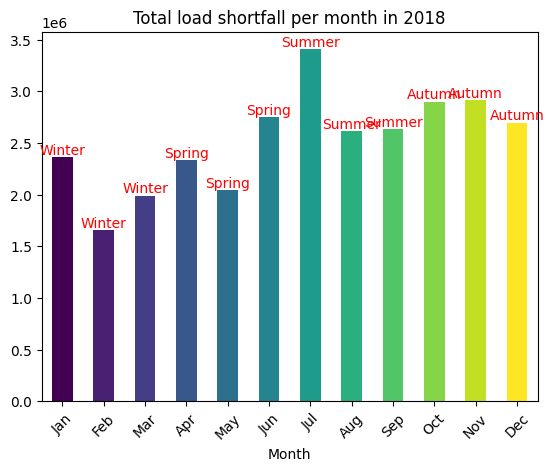

In [74]:
import calendar


# Map months to seasons
def get_season(month):
    if month in [1,2,3]:
        return 'Winter'
    elif month in [4, 5, 6]:
        return 'Spring'
    elif month in [7, 8, 9]:
        return 'Summer'
    else:
        return 'Autumn'

# Filter the data for the year
temp_2018 = temp_Train[temp_Train['Year'] == 2018]

# Group by month and calculate the sum of load shortfall for each month
monthly_load_shortfall = temp_2018.groupby('Month')['load_shortfall_3h'].sum()

# Define a colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(monthly_load_shortfall)))

# Plot the data
ax = monthly_load_shortfall.plot(kind='bar', color=colors)

# Customize the x-axis tick labels
ax.set_xticklabels([calendar.month_abbr[m] for m in range(1, 13)], rotation=45)

# Add season labels
for month in range(1, 13):
    season = get_season(month)
    plt.text(month - 1, monthly_load_shortfall[month], season, ha='center', va='bottom', color='red')

# Set the title
plt.title('Total load shortfall per month in 2018')

# Show the plot
plt.show()

In [75]:
## Train.describe().T
Train.shape

(11683, 40)

In [76]:
from scipy.stats.mstats import winsorize
## handling outliers by replacing them 
for i in Train.columns:
    winsorized_data = winsorize(Train[i], limits=(0.05, 0.05))
    Train[i] = winsorized_data
    
Train.describe().T
# Train.shape



,count,mean,std,min,25%,50%,75%,max
Year,11683.0,2016.500300,1.117584,2015.000000,2016.000000,2016.000000,2017.000000,2018.000000
Month,11683.0,6.525122,3.447945,1.000000,4.000000,7.000000,10.000000,12.000000
Day,11683.0,15.699392,8.634379,2.000000,8.000000,16.000000,23.000000,29.000000
Hour,11683.0,10.498844,6.873990,0.000000,4.500000,9.000000,15.000000,21.000000
Madrid_wind_speed,11683.0,2.388100,1.633866,0.666667,1.000000,2.000000,3.333333,6.333333
Madrid_humidity,11683.0,58.764901,23.831245,19.666667,38.000000,59.333333,80.000000,95.333333
Madrid_clouds_all,11683.0,20.318240,27.674336,0.000000,0.000000,0.000000,38.333333,80.000000
Madrid_pressure,11683.0,1012.033396,18.700799,958.000000,1012.666667,1017.333333,1021.666667,1029.666667
Madrid_rain_1h,11683.0,0.027339,0.080702,0.000000,0.000000,0.000000,0.000000,0.300000
Madrid_weather_id,11683.0,772.675209,71.175917,534.500000,800.000000,800.000000,800.666667,802.666667


Columns with low variance often contain little information or contribute very little to the overall patterns in the data, so we rather remove them in a sense. By removing features with low variance, the code aims to improve the quality of our dataset and potentially enhance the performance of machine learning models by focusing on the most informative features.

In [77]:
###removing columns with low variance
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0.1)
sel.fit_transform(Train)
Train.columns[sel.get_support(indices=True)]
Train = Train[Train.columns[sel.get_support(indices=True)]]
Train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11683 entries, 0 to 2919
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Year                  11683 non-null  int32  
 1   Month                 11683 non-null  int32  
 2   Day                   11683 non-null  int32  
 3   Hour                  11683 non-null  int32  
 4   Madrid_wind_speed     11683 non-null  float64
 5   Madrid_humidity       11683 non-null  float64
 6   Madrid_clouds_all     11683 non-null  float64
 7   Madrid_pressure       11683 non-null  float64
 8   Madrid_weather_id     11683 non-null  float64
 9   Madrid_temp           11683 non-null  float64
 10  Seville_humidity      11683 non-null  float64
 11  Seville_clouds_all    11683 non-null  float64
 12  Seville_wind_speed    11683 non-null  float64
 13  Seville_pressure      11683 non-null  int64  
 14  Seville_weather_id    11683 non-null  float64
 15  Seville_temp          116

In [78]:
monthly_load_shortfall = Madrid.groupby('Month')['load_shortfall_3h'].sum()

# Plot the data
plt.figure(figsize=(10, 6))
monthly_load_shortfall.plot(marker='o', linestyle='-')
plt.title('Monthly Load Shortfall in Madrid')
plt.xlabel('Month')
plt.ylabel('Load Shortfall')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

KeyError: 'Month'

Multicollinearity can negatively impact the predictive performance of a model. Highly correlated predictors can introduce redundancy and noise into the model, potentially leading to overfitting or poor generalization to new data. So let us see how can we handle them.

In [79]:
###Lessen multicollinearity, we will use the variance infation factor

# Add a constant column to the predictor variables for the intercept term
Train = sm.add_constant(Train)

# Create a DataFrame to store the VIF values
vif_data = pd.DataFrame()

# Calculate the VIF for each predictor variable
vif_data['Variable'] = Train.columns
vif_data['VIF'] = [variance_inflation_factor(Train.values, i) for i in range(Train.shape[1])]

# Exclude columns with VIF greater than 5, this is stardard
columns_to_exclude = vif_data[vif_data['VIF'] > 5]['Variable']
Train = Train.drop(columns_to_exclude, axis=1)

# displays unlimited number of columns
pd.set_option("display.max_columns", None)
Train.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Madrid_wind_speed',
       'Madrid_clouds_all', 'Madrid_pressure', 'Madrid_weather_id',
       'Seville_humidity', 'Seville_clouds_all', 'Seville_wind_speed',
       'Seville_pressure', 'Seville_weather_id', 'Barcelona_wind_speed',
       'Barcelona_wind_deg', 'Barcelona_pressure', 'Barcelona_weather_id',
       'Valencia_wind_speed', 'Valencia_wind_deg', 'Valencia_humidity',
       'Valencia_pressure', 'Bilbao_wind_speed', 'Bilbao_wind_deg',
       'Bilbao_clouds_all', 'Bilbao_pressure', 'Bilbao_weather_id'],
      dtype='object')

From the above we can see that all Features that had the high correlation were dropped i.e Cities with temp/min/max.

In [94]:
###Accesing combine train data 
Train = Train.drop(columns="Valencia_pressure")
X = Train[:len(traindf)] #slicing the df to select the df==train_df and leave the rest that is the test_df
x_test = Train[len(traindf):] #the remaining df is the test_df, these will used the prediction from the unseen data
Y = df[:len(traindf)][['load_shortfall_3h']] #our dependent variable

Y.tail() # confirm the rows are from the train data
x_test.head()
#X.shape


,Year,Month,Day,Hour,Madrid_wind_speed,Madrid_clouds_all,Madrid_pressure,Madrid_weather_id,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_pressure,Seville_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_pressure,Barcelona_weather_id,Valencia_wind_speed,Valencia_wind_deg,Valencia_humidity,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_clouds_all,Bilbao_pressure,Bilbao_weather_id
0,2018,1,2,0,5.000000,0.0,1029.666667,800.0,87.000000,0.000000,1.000000,24,800.000000,4.000000,176.666667,1017.333333,800.000000,5.000000,8,46.333333,3.000000,193.333333,20.000000,1025.666667,801.000000
1,2018,1,2,3,4.666667,0.0,1029.666667,800.0,89.000000,0.000000,0.666667,24,800.000000,4.666667,266.666667,1020.333333,800.333333,5.333333,8,53.666667,3.666667,143.333333,0.000000,1026.666667,721.000000
2,2018,1,2,6,2.333333,0.0,1029.666667,800.0,89.000000,6.666667,0.666667,24,800.333333,4.000000,263.333333,1023.000000,800.000000,5.000000,7,42.000000,2.333333,130.000000,0.000000,1025.333333,800.000000
3,2018,1,2,9,2.666667,0.0,1029.666667,800.0,93.333333,6.666667,1.333333,24,800.333333,2.333333,86.666667,1025.666667,800.000000,5.333333,7,45.000000,5.333333,196.666667,26.666667,1025.000000,801.333333
4,2018,1,2,12,4.000000,0.0,1029.666667,800.0,65.333333,0.000000,1.000000,24,800.000000,4.666667,283.333333,1026.000000,800.333333,7.000000,7,41.000000,5.333333,233.333333,26.666667,1022.333333,801.333333


<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, we will create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [95]:
# split data
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (7010, 25)
X_test shape: (1753, 25)
y_train shape: (7010, 1)
y_test shape: (1753, 1)


### Linear Regression 

In [96]:
# First model to be employed is the Linear Regressor

modelL = LinearRegression()

modelL.fit(X_train, y_train)

y_train_pred = modelL.predict(X_train) # Make predictions on the training set
y_test_pred = modelL.predict(X_test) 

# Evaluate the model
train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
test_rmse_linear = mean_squared_error(y_test, y_test_pred, squared=False)

# print(model.accuracy_score(X_test, y_test))

# Calculate R-squared for the testing set
r2 = r2_score(y_test, y_test_pred)

# Print the root mean squared error (RMSE) for training and testing data
print("Training RMSE:", train_rmse)
print("Testing RMSE:", test_rmse_linear)
print("R-squared:", r2)

Training RMSE: 4811.344023472443
Testing RMSE: 4920.967825657065
R-squared: 0.14014765007363583


### Random Forest Regressor

In [97]:
# Train our machine learning model
model = RandomForestRegressor(random_state = 42)
model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)

# Make predictions on the testing set
y_test_pred = model.predict(X_test)

# Evaluate the model
train_rmse_rf = mean_squared_error(y_train, y_train_pred, squared=False)
test_rmse_rf = mean_squared_error(y_test, y_test_pred, squared=False)

# Calculate R-squared for the testing set
r2_rf = r2_score(y_test, y_test_pred)

# Print the root mean squared error (RMSE) for training and testing data
print("Training RMSE:", train_rmse_rf)
print("Testing RMSE:", test_rmse_rf)
print("R-squared:", r2_rf) 

Training RMSE: 1162.5787334329227
Testing RMSE: 3176.0321230503323
R-squared: 0.641827198291137


### Decision Tree


In [98]:
# Train our machine learning model
modelDT = DecisionTreeRegressor(max_depth=5)

modelDT.fit(X_train, y_train)

y_train_pred = modelDT.predict(X_train) # Make predictions on the training set
y_test_pred = modelDT.predict(X_test)# Make predictions on the testing set


# Evaluate our model
train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
test_rmse_dt = mean_squared_error(y_test, y_test_pred, squared=False)
r2 = r2_score(y_test, y_test_pred)

# Our results
print("Training RMSE:", train_rmse)
print("Testing RMSE:", test_rmse_dt)
print("R-squared:", r2)

Training RMSE: 4065.392183522986
Testing RMSE: 4255.2829459310915
R-squared: 0.35704627443544423


### Gradient Boosting Regressor

In [99]:
# Train our machine learning model
gb_model = GradientBoostingRegressor(n_estimators=180, max_depth=6, random_state=42)

gb_model.fit(X_train, y_train)

y_train_pred_gb = model.predict(X_train)
y_test_pred_gb = gb_model.predict(X_test)

gb_rmse_train = mean_squared_error(y_train, y_train_pred_gb, squared=False)
gb_rmse = mean_squared_error(y_test, y_test_pred_gb, squared=False)
gb_r2 = r2_score(y_test, y_test_pred_gb)

# Print the results
print("Training Gradient RMSE:", gb_rmse_train)
print("Testing Gradient Boosting RMSE:", gb_rmse)
print("Testing Gradient Boosting R-squared:", gb_r2)




Training Gradient RMSE: 1162.5787334329227
Testing Gradient Boosting RMSE: 2926.013629523437
Testing Gradient Boosting R-squared: 0.695998643880537


<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

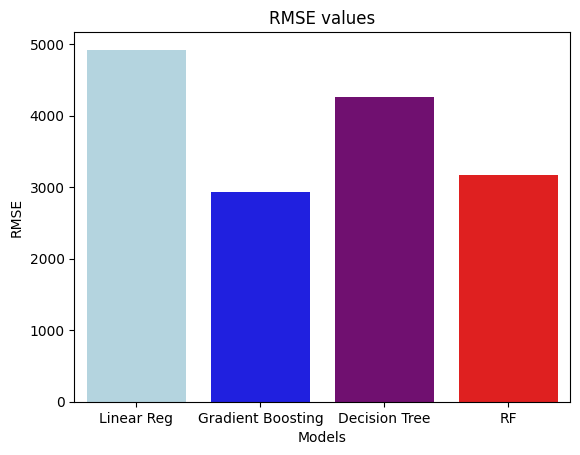

In [100]:
x = ["Linear Reg", "Gradient Boosting", "Decision Tree", 'RF']
colors = ['lightblue', 'blue', 'purple', 'red']
test_rmse = [test_rmse_linear, gb_rmse, test_rmse_dt, test_rmse_rf] 

sns.barplot(x=x, y=test_rmse,palette=colors)
plt.title("RMSE values")
plt.xlabel("Models")
plt.ylabel("RMSE")
plt.show()

# plt.savefig("rmse_plot.png") #Uncomment to savefig

<h4><i>Lower is better!</i></h4>

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

**How did we pick a good model?**

To determine how good a model is, we utilized the root mean square error (RMSE). The RMSE calculates the difference in predicted and actual values. A large RMSE suggests that our model is not capable of analyzing and forecasting new values. The RMSE score we consider is the RMSE score of the test datasets from our previously indicated 80/20 split.

According to the graph above, the gradient-boosting regressor was the best-performing model. All of the models we utilize can solve regression issues, and the gradient-boosting regressor and decision tree are also effective for classification problems.



In contrast to the linear regression model, the gradient regressor considers the relationship between X and y complex. This is more accurate than linear regression, which assumes a linear relationship. With the ability to deal with complex relationships and fine-tune the model, makes the gradient boosting the best model.

It has multiple models because it is an ensemble model. The following model in line learns from the preceding model's mistakes. The accuracy of the model is also affected by the hyperparameters, and this model provided us with the highest score.

The GradientBoostRegressor also includes **regularization** techniques to prevent overfitting, such as controlling the number of trees in the ensemble, the depth of each tree, and the learning rate (the step size during gradient descent).

The GradientBoostRegressor is a powerful and flexible algorithm known for its high predictive accuracy and robustness to noisy data. It's widely used in various regression tasks, including predicting stock prices, housing prices, and customer lifetime value.

# Testing

This is where we prepare our model predictions to be in the Kaggle Format. We then employ a model with the lowest **RMSE** score

In [101]:
pred = gb_model.predict(x_test)

df2 = pd.DataFrame(pred, columns=['load_shortfall_3h'])
df2.head()

,load_shortfall_3h
0,9754.933804
1,6000.746979
2,6606.309627
3,8230.566530
4,12256.988930


In [102]:
output  = pd.DataFrame({'time': testdf['time'], 'load_shortfall_3h': df2['load_shortfall_3h']})
output.head()
output.to_csv('submission_gb_.csv', index=False)

In [103]:
import pickle

model_save_path = "./trained/gb_model_final.pkl"
with open(model_save_path,'wb') as file:
    pickle.dump(gb_model,file)

In [104]:
model_load_path = "./trained/gb_model_final.pkl"
with open(model_load_path,'rb') as file:
    unpickled_model = pickle.load(file)

In [105]:
y_pred = unpickled_model.predict(X_test)
print(y_pred)


[ 8166.09296169 13657.4374002  16149.88737054 ... 12937.58957049
 11704.27451472  9719.63874933]


#### These are some of the recommendations we've compiled for the Spanish government.

1. **Improve Data Annotation:** They could enhance data annotation so that any data scientist can understand the numbers in each column.

2. **Energy Efficiency Measures:** Promote energy efficiency measures and energy-efficient technologies among the general public. The energy-saving solution should be a joint state-citizen endeavour.

3. **Capture energy consumption at the city level:** The dataset should capture energy consumption at the city level in order for the government to understand energy consumption and generation per city. Understanding energy use will make it much easier for the Spanish government to plan for the repair and management of the energy infrastructure.

4. **Use the Model to Understand Spain's Energy Needs:** Our model will assist the Spanish government in forecasting the electricity shortfall. They can always prepare and protect their inhabitants so that they never go without power. To meet their 2050 electricity mix objective, they will need to understand the overall trends of their electricity use via load shortfall, which our model excels at.

6. **Take into account population growth:** Spain has been grappling with an increase in immigration and population growth. Population growth will result in increased energy demand, as previously stated.

In [106]:
print("MSE:",mean_squared_error(y_test, y_pred))

MSE: 8561555.760156918
